# Imports

In [ ]:
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from cartopy import crs as ccrs, feature as cfeature
import seaborn as sns

import netCDF4 as nc

from datetime import datetime, timezone
import cmcrameri.cm as cmc
import cmcrameri.cm as cm

#plt.rcParams['figure.dpi'] = 200
#plt.rcParams.update({'font.size': 13})

import xarray as xr
import sys
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '..')))          # adjust .. or ../.. as needed
import SCEA as clt

# import glasbey colormap
import colorcet as cc


In [5]:
# File paths
current_dir = os.getcwd()
plots_save_path = os.path.join(current_dir, 'plots')
plots_save_path = "/Users/eliaserv/Documents/VSCode_projects/SCEA/plots"

s5p_filepath = "/Volumes/One Touch/Sentinel-5p NO2 Europe/S5P_NO2_June2024/"
s5p_files = os.listdir(s5p_filepath)
s5p_files = [f for f in s5p_files if f.endswith('.nc')]
s5p_files.sort()
print(f"Found {len(s5p_files)} S5P files.")

Found 292 S5P files.


# Data

In [6]:
# Define functions

def s5p_timestamp_to_unix(time_array):
    shape = np.array(time_array).shape
    time_array_flat = np.array(time_array).flatten()
    for i in range(len(time_array_flat)):
        if time_array_flat[i] != None:
            time_array_flat[i] = datetime(  int(time_array_flat[i][0:4]), 
                                            int(time_array_flat[i][5:7]), 
                                            int(time_array_flat[i][8:10]), 
                                            int(time_array_flat[i][11:13]), 
                                            int(time_array_flat[i][14:16]), 
                                            int(time_array_flat[i][17:19])).timestamp()
    return np.array(time_array_flat.reshape(shape), dtype=float)

def oco2_timestamp_to_unix(time_array):
    a = np.zeros(len(time_array))
    for i in range(len(time_array)):
        try:
            a[i] = datetime(time_array[i][0],time_array[i][1],
                                    time_array[i][2],time_array[i][3],
                                    time_array[i][4],time_array[i][5]).timestamp()
        except:
            a[i] = -1
    return a


def get_s5p_data_from_date_to_date(start_date, end_date, files, filepath=s5p_filepath):    
    # First get the indexes of start and end dates in "files". This assumes files are in cronological order.
    start_found, end_found = False, False
    for i in range(len(files)):
        if (files[i][116:122] == start_date) and (not start_found):
            start_index = i
            start_found = True
        if files[i][116:122] == end_date:
            end_index = i
            end_found = True

    # Raise exception if dates not found
    if not start_found:
        raise Exception("start date not found")
    if not end_found:
        raise Exception("end date not found")

    print("start date found in i:", start_index, " and end date in i:", end_index)

    # Initalize arrays
    s5p_no2 = []
    s5p_lon = []
    s5p_lat = []
    s5p_time = []
    s5p_qa = []

    for i in files[start_index : end_index]:
        try:
            dataset = nc.Dataset(filepath+i)
        except Exception as e:
            print(e)
            continue
        
        try:
            dataset.groups["PRODUCT"].variables["nitrogendioxide_tropospheric_column"][:].mask
        except Exception as e:
            print(e)
            continue
        
        #mask_off = np.logical_not(dataset.groups["PRODUCT"].variables["nitrogendioxide_tropospheric_column"][:].mask)
        s5p_no2.append(dataset.groups["PRODUCT"].variables["nitrogendioxide_tropospheric_column"][:].data)
        s5p_lon.append(dataset.groups["PRODUCT"].variables["longitude"][:].data)
        s5p_lat.append(dataset.groups["PRODUCT"].variables["latitude"][:].data)
        s5p_time.append(dataset.groups["PRODUCT"].variables["time_utc"][:])
        s5p_qa.append(dataset.groups["PRODUCT"].variables["qa_value"][:].data)

    return np.hstack(s5p_no2), np.hstack(s5p_lon), np.hstack(s5p_lat), np.hstack(s5p_time), np.hstack(s5p_qa)

In [7]:
clusters_data_folder_path = "/Users/eliaserv/Documents/VSCode_projects/SCEA/no2_clusters_from_s5p/"


# Load found clusters on from earlier runs
clusters_lat_max = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_lat_max")
clusters_lat_min = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_lat_min")
clusters_lon_max = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_lon_max")
clusters_lon_min = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_lon_min")
clusters_no2_amount = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_no2_amount")
clusters_no2_max = np.genfromtxt(clusters_data_folder_path+"2207211139_clusters_no2_max")
clusters_size = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_size")
clusters_timestamp = np.genfromtxt(clusters_data_folder_path+"2207220623_clusters_timestamp")

good_indexes = np.genfromtxt(clusters_data_folder_path+"2207220623_good_indexes")
good_indexes = np.array(good_indexes, dtype=int)
time_difference = np.genfromtxt(clusters_data_folder_path+"2207220623_time_difference")

clusters_all_clusters = np.genfromtxt(clusters_data_folder_path+"2207220623_clustering_all_clusters")

In [8]:
# Load the s5p no2 data from the same time period as the clusters

"""
date_of_clusters_first = datetime.fromtimestamp(clusters_timestamp[0], tz=timezone.utc).strftime("%y%m%d")
date_of_clusters_last = datetime.fromtimestamp(clusters_timestamp[2000], tz=timezone.utc).strftime("%y%m%d")

s5p_no2, s5p_lon, s5p_lat, s5p_time, s5p_qa = get_s5p_data_from_date_to_date(
    date_of_clusters_first, date_of_clusters_last, s5p_files
)

#Only data with quality > 0.75
s5p_no2, s5p_lon, s5p_lat, s5p_time = s5p_no2[s5p_qa>0.75], s5p_lon[s5p_qa>0.75], s5p_lat[s5p_qa>0.75], s5p_time[s5p_qa>0.75]

# Convert timestamps to unix
s5p_timestamp = s5p_timestamp_to_unix(s5p_time)
"""

'\ndate_of_clusters_first = datetime.fromtimestamp(clusters_timestamp[0], tz=timezone.utc).strftime("%y%m%d")\ndate_of_clusters_last = datetime.fromtimestamp(clusters_timestamp[2000], tz=timezone.utc).strftime("%y%m%d")\n\ns5p_no2, s5p_lon, s5p_lat, s5p_time, s5p_qa = get_s5p_data_from_date_to_date(\n    date_of_clusters_first, date_of_clusters_last, s5p_files\n)\n\n#Only data with quality > 0.75\ns5p_no2, s5p_lon, s5p_lat, s5p_time = s5p_no2[s5p_qa>0.75], s5p_lon[s5p_qa>0.75], s5p_lat[s5p_qa>0.75], s5p_time[s5p_qa>0.75]\n\n# Convert timestamps to unix\ns5p_timestamp = s5p_timestamp_to_unix(s5p_time)\n'

# Different versions of clustering methods

In [9]:
from sklearn import preprocessing
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.metrics.pairwise import haversine_distances



"""
Version 1.0
This is a density based clustering method with a twist.
Normal version starts with one point and draws a circle around it, and all the points that fall within that circle gets added to the cluster. 
And then the new added points draw the same circle around them and so on.
Here I did the same thing but I made the circle to be a function of the NO2. 
So a larger NO2 point will draw a larger circle. So at some points the NO2 is small enough to not reach neighbouring points.
"""
def density_based_clustering_with_varying_radius(points, no2, starting_point=None):

    # Distance matrix of points
    distance_matrix = squareform(pdist(points))

    # Initialize cluster
    cluster = np.zeros(len(points), dtype=bool)

    if starting_point:
        cluster[starting_point] = True
        added_points = [starting_point]
    else:
        # Find the index with max no2 value, if no starting point provided. Add it to the cluster
        argmax = np.argmax(no2)
        cluster[argmax] = True
        added_points = [argmax]

    while True:
        # Find points in radius of r of added points that are not already in the cluster. These are the new points.
        not_old_points = np.logical_not(cluster)
        new_points = np.zeros(len(points), dtype=bool)  #initialize array with Falses
        for i in added_points:  #Find points to be added in this iteration
            new_points =  np.logical_or(new_points , np.logical_and( distance_matrix[i] < radius(no2[i]), not_old_points) )
        #print(i, new_points)
        cluster = np.logical_or(new_points, cluster)  #Add new point to cluster
        added_points = np.nonzero(new_points)[0]  #get index of added points
        
        if new_points.sum() == 0: break

    return cluster







"""
Version 2.1
This starts with radius thats equal to the distance to nth closest point and then applies the radius function (thats now as a input in the method).

Improvement ideas:
* check - Have distance matrix as an input
* check - Have n amount of close points as input
* Have the radius depend on the clusters "strength", since the sensitivity settings on the radius work now only on the largest one.
* Minimum distance 
"""

# Stars with radius thats equal to distance to closest point, and then applies the radius function
def density_based_clustering_with_varying_radius_v21(points, no2, radius, distance_matrix="euclidean", start_points_in_radius=5, starting_point=None):

    no2 = preprocessing.StandardScaler().fit_transform(no2.reshape(-1, 1)).flatten()
    
    # Distance matrix of points
    if isinstance(distance_matrix, str):
        if distance_matrix == "euclidean":
            distance_matrix = squareform(pdist(points))
        elif distance_matrix == 'haversine':
            distance_matrix = haversine_distances( np.radians( points ) ) * 6371000/1000  # multiply by Earth radius to get kilometers
        else:
            raise Exception("What the fuck is this metric?")


    # Initialize cluster
    cluster = np.zeros(len(points), dtype=bool)


    if starting_point:
        cluster[starting_point] = True
        added_points = [starting_point]
    else:
        # Find the index with max no2 value. Add it to the cluster
        argmax = np.argmax(no2)
        cluster[argmax] = True
        added_points = [argmax]


    # Find points around of added points that are not already in the cluster. These are the new points.
    while True:
        not_old_points = np.logical_not(cluster)
        new_points = np.zeros(len(points), dtype=bool)  #initialize array with Falses

        # Find points added in this iteration
        for i in added_points:
            closest_point_not_in_cluster = distance_matrix[i][not_old_points]
            points_in_radius = distance_matrix[i] < np.partition(distance_matrix[i],start_points_in_radius)[start_points_in_radius]*radius(no2[i])
            new_points =  np.logical_or(new_points , np.logical_and(points_in_radius , not_old_points))
        
        cluster = np.logical_or(new_points, cluster)  #Add new point to cluster
        added_points = np.nonzero(new_points)[0]  #get index of added points
        
        #Stop when no new points are added
        if new_points.sum() == 0: break 

    return cluster






"""
Version 2.2
This starts with radius thats equal to the distance to closest point not in the cluster.

Improvement ideas:
* check - Have distance matrix as an input
* check - Have n amount of close points as input
* Have the radius depend on the clusters "strength", since the sensitivity settings on the radius work now only on the largest one.
* Minimum distance 
"""

# Stars with radius thats equal to distance to closest point, and then applies the radius function
def density_based_clustering_with_varying_radius_v22(points, no2, radius, distance_matrix="euclidean", start_points_in_radius=5, starting_point=None):

    no2 = preprocessing.StandardScaler().fit_transform(no2.reshape(-1, 1)).flatten()

    # Distance matrix of points
    if isinstance(distance_matrix, str):
        if distance_matrix == "euclidean":
            distance_matrix = squareform(pdist(points))
        elif distance_matrix == 'haversine':
            distance_matrix = haversine_distances( np.radians( points ) ) * 6371000/1000  # multiply by Earth radius to get kilometers
        else:
            raise Exception("What the fuck is this metric?")


    # Initialize cluster
    cluster = np.zeros(len(points), dtype=bool)

    if starting_point:
        cluster[starting_point] = True
        added_points = [starting_point]
    else:
        # Find the index with max no2 value. Add it to the cluster
        argmax = np.argmax(no2)
        cluster[argmax] = True
        added_points = [argmax]


    # Find points around of added points that are not already in the cluster. These are the new points.
    while True:
        not_old_points = np.logical_not(cluster)
        new_points = np.zeros(len(points), dtype=bool)  #initialize array with Falses

        # Find points added in this iteration
        for i in added_points:
            try:
                radius_of_closest_point_not_in_cluster = np.min(distance_matrix[i][not_old_points])
            except:
                print(":o")
            radius_of_nth_closest_point = np.partition(distance_matrix[i],start_points_in_radius)[start_points_in_radius]
            if radius_of_closest_point_not_in_cluster < radius_of_nth_closest_point:
                points_in_radius = distance_matrix[i] < radius_of_closest_point_not_in_cluster*radius(no2[i])
                new_points =  np.logical_or(new_points , np.logical_and(points_in_radius , not_old_points))
                
        
        cluster = np.logical_or(new_points, cluster)  #Add new point to cluster
        added_points = np.nonzero(new_points)[0]  #get index of added points
        
        #Stop when no new points are added
        if new_points.sum() == 0: break 

    return cluster






"""
Version 2.3
This starts with radius thats equal to the distance to closest point not in the cluster. New added points stop 'radiating' when 
closest point not in the cluster swallows more than max_points_in_start_radius of points or when it doesn't add new points.

Improvement ideas:
* Have the radius depend on the clusters "strength", since the sensitivity settings on the radius work now only on the largest cluster.
* Minimum distance 
* Have the added points intensity affect. Since now the radius function only spreads
"""

# Stars with radius thats equal to distance to closest point, and then applies the radius function
def density_based_clustering_with_varying_radius_v23(points, no2, radius, distance_matrix="euclidean", max_points_in_start_radius=6, starting_point=None):

    no2 = preprocessing.StandardScaler().fit_transform(no2.reshape(-1, 1)).flatten()
    #print(no2.max())
    
    # Distance matrix of points
    if isinstance(distance_matrix, str):
        if distance_matrix == "euclidean":
            distance_matrix = squareform(pdist(points))
        elif distance_matrix == 'haversine':
            distance_matrix = haversine_distances( np.radians( points ) ) * 6371000/1000  # multiply by Earth radius to get kilometers
        else:
            raise Exception("What the fuck is this metric?")


    # Initialize cluster
    cluster = np.zeros(len(points), dtype=bool)
    radiating_points = np.zeros(len(points), dtype=bool)

    if starting_point:
        cluster[starting_point] = True
        radiating_points[starting_point] = True
    else:
        # Find the index with max no2 value. Add it to the cluster
        argmax = np.argmax(no2)
        cluster[argmax] = True
        radiating_points[argmax] = True


    # Find points around of added points that are not already in the cluster. These are the new points.
    while True:
        not_old_points = np.logical_not(cluster)
        new_points = np.zeros(len(points), dtype=bool)  #initialize array with Falses

        # Find points added in this iteration
        for i in np.nonzero(radiating_points)[0]:
            try:
                radius_of_closest_point_not_in_cluster = np.min(distance_matrix[i][not_old_points])
            except:
                print(":o")
            radius_of_nth_closest_point = np.partition(distance_matrix[i],max_points_in_start_radius)[max_points_in_start_radius]

            points_in_radius = distance_matrix[i] < radius_of_closest_point_not_in_cluster*radius(no2[i])
            if (radius_of_closest_point_not_in_cluster < radius_of_nth_closest_point) and (points_in_radius.sum()!=0):
                new_points =  np.logical_or(new_points , np.logical_and(points_in_radius , not_old_points))
            else:
                # Stop radiating
                radiating_points[i] = False
        
        cluster = np.logical_or(new_points, cluster)  #Add new point to cluster
        radiating_points = np.logical_or(radiating_points, new_points)  #get index of added points
        
        #Stop when no new points are added
        if new_points.sum() == 0: break 

    return cluster





# Stars with radius thats equal to distance to closest point, and then applies the radius function.

def find_one_cluster_v30(points, no2, radius, distance_matrix="euclidean", max_points_in_start_radius=8, preprocessor='Standard',starting_point=None):
    
    # Preprocessing
    if preprocessor == 'Standard':
        no2 = preprocessing.StandardScaler().fit_transform(no2.reshape(-1, 1)).flatten()
    elif preprocessor == 'Quantile':
        no2 = preprocessing.QuantileTransformer(output_distribution='uniform', n_quantiles=3).fit_transform(no2.reshape(-1, 1)).flatten()
    elif preprocessor == 'None':
        pass
    else:
        no2 = preprocessor.fit_transform(no2.reshape(-1, 1)).flatten()
    
    # Distance matrix for points
    if isinstance(distance_matrix, str):
        if distance_matrix == "euclidean":
            distance_matrix = squareform(pdist(points))
        elif distance_matrix == 'haversine':
            distance_matrix = haversine_distances( np.radians( points ) ) * 6371000/1000  # multiply by Earth radius to get kilometers
        else:
            raise Exception("What is this metric? :DD")

    # Initialize cluster
    cluster = np.zeros(len(points), dtype=bool)
    radiating_points = np.zeros(len(points), dtype=bool)

    if starting_point:
        cluster[starting_point] = True
        radiating_points[starting_point] = True
    else:
        # Find the index with max no2 value. Add it to the cluster
        argmax = np.argmax(no2)
        cluster[argmax] = True
        radiating_points[argmax] = True


    # Find points around of added points that are not already in the cluster. These are the new points.
    while True:
        not_old_points = np.logical_not(cluster)
        new_points = np.zeros(len(points), dtype=bool)  #initialize array with Falses

        # Find points added in this iteration
        for i in np.nonzero(radiating_points)[0]:
            try:
                radius_of_closest_point_not_in_cluster = np.min(distance_matrix[i][not_old_points])
            except:
                pass
            radius_of_nth_closest_point = np.partition(distance_matrix[i],max_points_in_start_radius)[max_points_in_start_radius]

            points_in_radius = distance_matrix[i] < radius_of_closest_point_not_in_cluster*radius(no2[i])
            if (radius_of_closest_point_not_in_cluster < radius_of_nth_closest_point) and (points_in_radius.sum()!=0):
                new_points =  np.logical_or(new_points , np.logical_and(points_in_radius , not_old_points))
            else:
                # Stop radiating
                radiating_points[i] = False
        
        cluster = np.logical_or(new_points, cluster)  #Add new point to cluster
        radiating_points = np.logical_or(radiating_points, new_points)  #get index of added points
        
        #Stop when no new points are added
        if new_points.sum() == 0: break 

    return cluster



# Stars with radius thats equal to distance to closest point, and then applies the radius function.

def find_one_cluster_v31(points, point_value, radius, distance_matrix="euclidean", max_points_in_start_radius=8, preprocessor='Standard',starting_point=None):
    
    # Preprocessing
    if preprocessor == 'Standard':
        point_value = preprocessing.StandardScaler().fit_transform(point_value.reshape(-1, 1)).flatten()
    elif preprocessor == 'Quantile':
        point_value = preprocessing.QuantileTransformer(output_distribution='uniform', n_quantiles=3).fit_transform(point_value.reshape(-1, 1)).flatten()
    elif preprocessor == 'None':
        pass
    else:
        point_value = preprocessor.fit_transform(point_value.reshape(-1, 1)).flatten()
    
    # Distance matrix for points
    if isinstance(distance_matrix, str):
        if distance_matrix == "euclidean":
            distance_matrix = squareform(pdist(points))
        elif distance_matrix == 'haversine':
            distance_matrix = haversine_distances( np.radians( points ) ) * 6371000/1000  # multiply by Earth radius to get kilometers
        else:
            raise Exception("What is this metric? :DD")

    # Initialize cluster
    cluster = np.zeros(len(points), dtype=bool)
    radiating_points = np.zeros(len(points), dtype=bool)

    if starting_point:
        cluster[starting_point] = True
        radiating_points[starting_point] = True
    else:
        # Find the index with max point_value value. Add it to the cluster
        argmax = np.argmax(point_value)
        cluster[argmax] = True
        radiating_points[argmax] = True


    # Find points around of added points that are not already in the cluster. These are the new points.
    while True:
        not_old_points = np.logical_not(cluster)
        new_points = np.zeros(len(points), dtype=bool)  #initialize array with Falses

        # Find points added in this iteration
        for i in np.nonzero(radiating_points)[0]:
            try:
                radius_of_closest_point_not_in_cluster = np.min(distance_matrix[i][not_old_points])
            except:
                pass
            radius_of_nth_closest_point = np.partition(distance_matrix[i],max_points_in_start_radius)[max_points_in_start_radius]

            points_in_radius = distance_matrix[i] < radius_of_closest_point_not_in_cluster*radius(point_value[i])
            if (radius_of_closest_point_not_in_cluster < radius_of_nth_closest_point) and (points_in_radius.sum()!=0):
                new_points =  np.logical_or(new_points , np.logical_and(points_in_radius , not_old_points))
            else:
                # Stop radiating
                radiating_points[i] = False
        
        cluster = np.logical_or(new_points, cluster)  #Add new point to cluster
        radiating_points = np.logical_or(radiating_points, new_points)  #get index of added points
        
        #Stop when no new points are added
        if new_points.sum() == 0: break 

    return cluster



"""
Version 3.1

This has the option to determine the amount of clusters automatically, by having a stoping rule.
The stopping rule works by checking if new clusters max point is smaller than x standard deviations from mean.
"""



def density_based_clustering_with_varying_radius_v31(points, point_value, radius_func, n_clusters='automatic', stds=6, distance_matrix="euclidean", max_points_in_start_radius=8, local_box_size=3):

    if (not isinstance(n_clusters, int)) and (not n_clusters=='automatic'):
        raise Exception("n_clusters not valid")
    if np.isnan(point_value).sum() > 0:
        raise Exception("point_value has nan values")

    not_clustered = np.ones(len(point_value), dtype=bool)
    not_clustered_indexes = np.arange(len(point_value))
    clusters = np.zeros(len(point_value))   # 0 = no cluster, otherwise the index of the cluster

    # Set threshold for automatic stopping condition
    if n_clusters=='automatic':
        point_value_threshold = preprocessing.StandardScaler().fit_transform(point_value.reshape(-1, 1)).flatten()
        point_value_threshold[point_value_threshold<stds] = np.inf
        if np.isinf(point_value_threshold).sum() == len(point_value_threshold):
            raise Exception("No clusters found. All points are too close to the mean. Consider lowering stds. Currently stds=%i." %stds)
        point_value_threshold = point_value[np.argmin(point_value_threshold)]
    else:
        point_value_threshold = -np.inf

    i=0
    while True:

        points_not_clustered = points[not_clustered]
        point_value_not_clustered = point_value[not_clustered]

        # Stopping condition
        if isinstance(n_clusters, int) and i==n_clusters:
            break
        elif np.max(point_value_not_clustered)<point_value_threshold:
            print("Found ", i, " clusters")
            break
        

        # Crop the area to a smaller box. Save points to local_points
        if local_box_size != 0:
            argmax = np.argmax(point_value_not_clustered)
            center_lon = points_not_clustered[argmax,0]
            center_lat = points_not_clustered[argmax,1]
            points_in_range = np.logical_and( 
                np.logical_and(points_not_clustered[:,0]>center_lon-(local_box_size/2), points_not_clustered[:,0]<center_lon+(local_box_size/2)),
                np.logical_and(points_not_clustered[:,1]>center_lat-(local_box_size/2), points_not_clustered[:,1]<center_lat+(local_box_size/2))
            )
            local_points = points_not_clustered[points_in_range]
            local_point_value = point_value_not_clustered[points_in_range]
            local_points_index = np.where(points_in_range)[0]
        # Or just use all points
        else: 
            local_points = points_not_clustered
            local_point_value = point_value_not_clustered
        
        # cluster
        clt = find_one_cluster_v31(local_points, local_point_value, radius_func, distance_matrix, max_points_in_start_radius)
        clusters[not_clustered_indexes[local_points_index[clt]]] = i+1
        
        # Update not_clustered
        not_clustered=clusters==0
        not_clustered_indexes = np.where(not_clustered)[0]
        
        i=i+1
    
    return clusters

# Different version of the method

In [10]:
# Import data from Poland

# Import data
s5p_filepath_p = "/Volumes/One Touch/Sentinel-5P TROPOMI Tropospheric NO2 1-Orbit L2 5.5km x 3.5km (S5P_L2__NO2____HiR)/Europe/"
s5p_files_p = ["S5P_OFFL_L2__NO2____20191205T110815_20191205T124944_11110_01_010302_20191211T162026.nc"]
dataset = nc.Dataset(s5p_filepath_p+s5p_files_p[0])

# Get variables
pol_lon = dataset.groups["PRODUCT"].variables["longitude"][:].data
pol_lat = dataset.groups["PRODUCT"].variables["latitude"][:].data
pol_no2 = dataset.groups["PRODUCT"].variables["nitrogendioxide_tropospheric_column"][:].data
pol_qa = dataset.groups["PRODUCT"].variables["qa_value"][:].data

# Area where we want the data from
area = [12, 31, 45, 58]   #lonW, lonE, latS, latN

lon_boolean = np.logical_and(pol_lon >= area[0], pol_lon <= area[1])
lat_boolean = np.logical_and(pol_lat >= area[2], pol_lat <= area[3]) 
area_boolean = np.logical_and(lon_boolean,lat_boolean)

# Get only data from that area
pol_lon, pol_lat, pol_no2, pol_qa = pol_lon[area_boolean], pol_lat[area_boolean], pol_no2[area_boolean], pol_qa[area_boolean]

# Good quality data
pol_bool = pol_qa>0.75

pol_lon_q = pol_lon[pol_bool]
pol_lat_q = pol_lat[pol_bool]
pol_no2_q = pol_no2[pol_bool]

# Check the date of the data
dataset.groups["PRODUCT"].variables["time_utc"][:]

array([['2019-12-05T11:29:50.135000Z', '2019-12-05T11:29:50.975000Z',
        '2019-12-05T11:29:51.815000Z', ...,
        '2019-12-05T12:28:06.977000Z', '2019-12-05T12:28:07.817000Z',
        '2019-12-05T12:28:08.657000Z']], shape=(1, 4166), dtype=object)

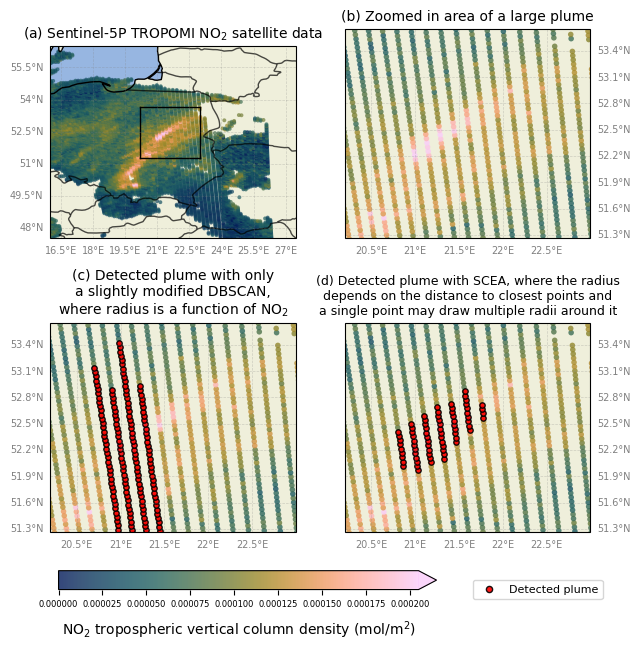

In [11]:
# n arg largest points
n = 6  # change this to your desired number
indices = np.argpartition(pol_no2_q, -n)[-n:]
indices = indices[np.argsort(-pol_no2_q[indices])]


def radius(no2):
    return no2 * 795


cluster_v1 = density_based_clustering_with_varying_radius(
    np.transpose([pol_lat_q, pol_lon_q]), pol_no2_q, starting_point=indices[2]
)

test_radius = lambda x: np.min([1 + x * 0.5 - 1.6, 2])
cluster_v31 = find_one_cluster_v31(
    np.transpose([pol_lat_q, pol_lon_q]),
    pol_no2_q,
    test_radius,
    distance_matrix="euclidean",
    max_points_in_start_radius=7,
    preprocessor="Standard",
    starting_point=indices[2],
)

ticks_font = 7
s=16

fig, axs = plt.subplots(
    2, 2, figsize=(8, 10), subplot_kw={"projection": ccrs.PlateCarree()}, 
)

extent_big = [16 + 0.01, 27.5 - 0.02, 47.5 + 0.01, 56.5 - 0.01]
extent_zoom = [20.2, 23, 51.26, 53.65]

# 1. subplot =============================================================================
ax = axs[0, 0]

# Add cartopy features
ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=0.7, linewidth=1, rasterized=True)
ax.coastlines(resolution="50m", rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), rasterized=True)

skrt = ax.scatter(
    pol_lon_q,
    pol_lat_q,
    c=pol_no2_q,
    transform=ccrs.Geodetic(),
    vmin=0,
    vmax=0.000205,
    s=8,
    alpha=0.7,
    cmap=cm.batlow,
    edgecolor="none",
    rasterized=True,
)

ax.set_title("(a) Sentinel-5P TROPOMI NO$_2$ satellite data", fontsize=10)

ax.set_extent(extent_big)

# Draw a box that is the size of the zoomed in area
ax.plot(
    [extent_zoom[0], extent_zoom[0]],
    [extent_zoom[2], extent_zoom[3]],
    color="k",
    linewidth=1,
    transform=ccrs.Geodetic(),
)
ax.plot(
    [extent_zoom[1], extent_zoom[1]],
    [extent_zoom[2], extent_zoom[3]],
    color="k",
    linewidth=1,
    transform=ccrs.Geodetic(),
)
ax.plot(
    [extent_zoom[0], extent_zoom[1]],
    [extent_zoom[2], extent_zoom[2]],
    color="k",
    linewidth=1,
    transform=ccrs.Geodetic(),
)
ax.plot(
    [extent_zoom[0], extent_zoom[1]],
    [extent_zoom[3], extent_zoom[3]],
    color="k",
    linewidth=1,
    transform=ccrs.Geodetic(),
)

gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.xlabel_style = {"size": ticks_font, "color": "gray"}
gl.ylabel_style = {"size": ticks_font, "color": "gray"}
gl.top_labels = False
gl.right_labels = False


# 2. Subplot =============================================================================

ax = axs[0, 1]

# Add caropy features
ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=1, linewidth=1, rasterized=True)
ax.coastlines(resolution="50m", rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), rasterized=True)

# skrt = ax.scatter(pol_lon_q,pol_lat_q,c=pol_no2_q, transform=ccrs.Geodetic(), vmin=0,vmax=0.000205, s=60, alpha=0.8, cmap=cm.batlow, edgecolor='none')


# Create a boolean mask for points within the extent_zoom boundaries
mask = (
    (pol_lon_q >= extent_zoom[0] - 0.1)
    & (pol_lon_q <= extent_zoom[1] + 0.1)
    & (pol_lat_q >= extent_zoom[2] - 0.1)
    & (pol_lat_q <= extent_zoom[3] + 0.1)
)
# Apply the mask to filter the points
filtered_pol_lon_q = pol_lon_q[mask]
filtered_pol_lat_q = pol_lat_q[mask]
filtered_pol_no2_q = pol_no2_q[mask]

# Plot the filtered points
skrt = ax.scatter(
    filtered_pol_lon_q,
    filtered_pol_lat_q,
    c=filtered_pol_no2_q,
    transform=ccrs.Geodetic(),
    vmin=0,
    vmax=0.000205,
    s=s,
    alpha=0.8,
    cmap=cm.batlow,
    edgecolor="none",
)


ax.set_title("(b) Zoomed in area of a large plume", fontsize=10)
ax.set_extent(extent_zoom)

gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.xlabel_style = {"size": ticks_font, "color": "gray"}
gl.ylabel_style = {"size": ticks_font, "color": "gray"}
gl.top_labels = False
gl.left_labels = False


# 3. subplot =============================================================================

ax = axs[1, 0]

# Add caropy features
ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=1, linewidth=1, rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)

pcm = ax.scatter(
    filtered_pol_lon_q,
    filtered_pol_lat_q,
    c=filtered_pol_no2_q,
    transform=ccrs.Geodetic(),
    vmin=0,
    vmax=0.000205,
    s=s,
    alpha=0.8,
    cmap=cm.batlow,
    edgecolor="none",
)
scatter2 = ax.scatter(
    pol_lon_q[cluster_v1],
    pol_lat_q[cluster_v1],
    c="r",
    alpha=0.9,
    edgecolors="none",
    s=s-1,
    transform=ccrs.Geodetic(),
)
scatter2.set_edgecolor((0, 0, 0, 0.5))  # semi-transparent black

ax.set_title(
    "(c) Detected plume with only\na slightly modified DBSCAN,\nwhere radius is a function of NO$_2$",
    fontsize=10
)

ax.set_extent(extent_zoom)

gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.xlabel_style = {"size": ticks_font, "color": "gray"}
gl.ylabel_style = {"size": ticks_font, "color": "gray"}
gl.top_labels = False
gl.right_labels = False

# 4. subplot =============================================================================

ax = axs[1, 1]

# Add caropy features
ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=1, linewidth=1, rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)

skrt = ax.scatter(
    filtered_pol_lon_q,
    filtered_pol_lat_q,
    c=filtered_pol_no2_q,
    transform=ccrs.Geodetic(),
    vmin=0,
    vmax=0.000205,
    s=s,
    alpha=0.8,
    cmap=cm.batlow,
    edgecolor="none",
)

scatter = ax.scatter(
    pol_lon_q[cluster_v31],
    pol_lat_q[cluster_v31],
    c="r",
    alpha=0.9,
    s=s-1,
    transform=ccrs.Geodetic(),
)
scatter.set_edgecolor((0, 0, 0, 1))  # semi-transparent black

# For legend
ax.scatter(
    [0],
    [0],
    c="r",
    alpha=0.9,
    edgecolors=(0, 0, 0, 1),
    s=20,
    transform=ccrs.Geodetic(),
    label="Detected plume",
)

ax.set_title(
    "(d) Detected plume with SCEA, where the radius\ndepends on the distance to closest points and\na single point may draw multiple radii around it",
    fontsize=9
)

ax.set_extent(extent_zoom)

gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.xlabel_style = {"size": ticks_font, "color": "gray"}
gl.ylabel_style = {"size": ticks_font, "color": "gray"}
gl.top_labels = False
gl.left_labels = False

# =============================================================================


# =============================================================================

plt.legend(bbox_to_anchor=(0.5, -0.2), loc="upper left", fontsize=8)

fig.subplots_adjust(right=0.8)

cbar = fig.colorbar(
    pcm,
    ax=axs.ravel().tolist(),
    shrink=0.7,
    extend="max",
    anchor=(0.05, 1.8),
    orientation="horizontal",
)
cbar.ax.tick_params(labelsize=6)

cbar.set_label("NO$_2$ tropospheric vertical column density (mol/m$^2$)", labelpad=8)

# Save the figure in vector graphics format
save_path = os.path.join(plots_save_path, "radii_comparison_v3.pdf")
plt.savefig(save_path, format="pdf", bbox_inches="tight", transparent=True)

plt.show()

# Process of the SCEA algorithm

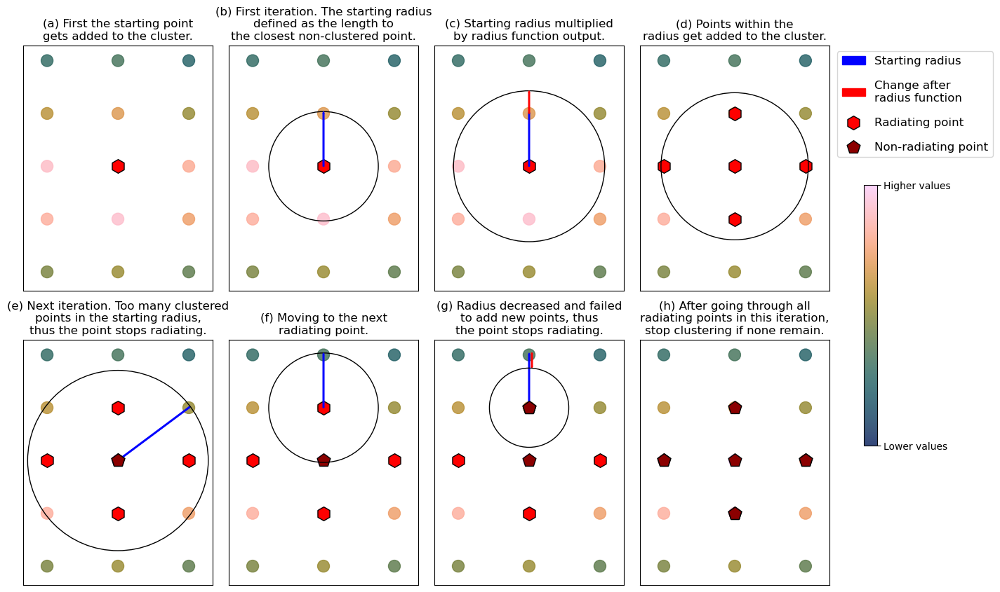

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import cmcrameri.cm as cm



def test2data():
    # Generate harder test points
    meshgrid = np.meshgrid(np.linspace(-3, 12, 5), np.linspace(0, 14, 6))
    test2_lon = meshgrid[0].flatten()
    test2_lat = meshgrid[1].flatten()
    test2_no2 = ((np.sin((test2_lon+4) / 5) + np.sin(test2_lat / 3)) / (0.0001 * np.abs(test2_lon) + 1) +
                 np.random.normal(0, 0.0001, len(test2_lon)) + 3) ** 2.5
    return test2_lon, test2_lat, test2_no2

test2_lon, test2_lat, test2_no2 = test2data()

title_font_size = 12
marker_radiating = 'h'
marker_non_radiating = 'p'
size_highlighted = 200
size=150
arrowprops = dict(head_width=0.08, head_length=0.1,width=0.06)


fig, axs = plt.subplots(2, 4, figsize=(16, 10))
axs = axs.flatten()

def scatter_plot(ax, lon, lat, value, size, highlight=None, color='r', marker='p'):
    sc = ax.scatter(lon, lat, c=value, s=size, cmap=cm.batlow, alpha=0.8)
    if highlight is not None:
        ax.scatter(lon[highlight], lat[highlight], c=color, s=size_highlighted, edgecolors='k', marker=marker)
    ax.set_xlim([-0.5, 9.5])
    ax.set_ylim([-1, 12])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    return sc



# First plot
#scatter_plot(axs[0], test2_lon, test2_lat, test2_no2, size)
#axs[0].set_title('a) Data points. Brighter colour\nmeans higher value.', fontsize=title_font_size)

# First plot
scatter_plot(axs[0], test2_lon, test2_lat, test2_no2, size, highlight=12, marker=marker_radiating)
axs[0].set_title('(a) First the starting point\ngets added to the cluster.', fontsize=title_font_size)

# Third plot
scatter_plot(axs[1], test2_lon, test2_lat, test2_no2, size, highlight=12, marker=marker_radiating)
circle = Circle((test2_lon[12], test2_lat[12]), test2_lat[12] - test2_lat[7] + 0.1, edgecolor='black', facecolor='none')
axs[1].add_patch(circle)
axs[1].arrow(test2_lon[12], test2_lat[12], 0, test2_lat[12] - test2_lat[7], fc='blue', ec='blue', **arrowprops)
axs[1].set_title('(b) First iteration. The starting radius\ndefined as the length to\nthe closest non-clustered point.', fontsize=title_font_size)

# Fourth plot
scatter_plot(axs[2], test2_lon, test2_lat, test2_no2, size, highlight=12, marker=marker_radiating)
circle = Circle((test2_lon[12], test2_lat[12]), test2_lat[12] - test2_lat[7] + 1.2, edgecolor='black', facecolor='none')
axs[2].add_patch(circle)
axs[2].arrow(test2_lon[12], test2_lat[12], 0, (test2_lat[12] - test2_lat[7]), fc='blue', ec='blue', **arrowprops)
axs[2].arrow(test2_lon[17], test2_lat[17], 0, 1.1, fc='red', ec='red', **arrowprops)
axs[2].set_title('(c) Starting radius multiplied\nby radius function output.', fontsize=title_font_size)

# Fifth plot
scatter_plot(axs[3], test2_lon, test2_lat, test2_no2, size, highlight=[7,12,13,17,11], marker=marker_radiating)
circle = Circle((test2_lon[12], test2_lat[12]), test2_lat[12] - test2_lat[7] + 1.1, edgecolor='black', facecolor='none')
axs[3].add_patch(circle)
axs[3].set_title('(d) Points within the\nradius get added to the cluster.', fontsize=title_font_size)

# Sixth plot
scatter_plot(axs[4], test2_lon, test2_lat, test2_no2, size, highlight=12, color='#8B0000', marker=marker_non_radiating)
axs[4].arrow(test2_lon[12], test2_lat[12], test2_lon[18] - test2_lon[12], test2_lat[18] - test2_lat[12],
                fc='blue', ec='blue', label="asdf", **arrowprops)
axs[4].scatter(test2_lon[[7,13,11,17]], test2_lat[[7,13,11,17]], c='r', s=size_highlighted,edgecolors='k', marker=marker_radiating)
axs[4].scatter(test2_lon[12], test2_lat[12], c='#8B0000', s=size_highlighted,edgecolors='k', marker=marker_non_radiating)
circle = Circle((test2_lon[12], test2_lat[12]),
                np.sqrt((test2_lat[18] - test2_lat[12]) ** 2 + (test2_lon[18] - test2_lon[12]) ** 2) + 0.1,
                edgecolor='black', facecolor='none')
axs[4].add_patch(circle)
axs[4].set_title('(e) Next iteration. Too many clustered\npoints in the starting radius,\nthus the point stops radiating.', fontsize=title_font_size)

# Seventh plot
scatter_plot(axs[5], test2_lon, test2_lat, test2_no2, size, highlight=12, color='#8B0000', marker=marker_non_radiating)
axs[5].scatter(test2_lon[[7,13,11,17]], test2_lat[[7,13,11,17]], c='r', s=size_highlighted,edgecolors='k', marker=marker_radiating)
circle = Circle((test2_lon[17], test2_lat[17]),
                np.sqrt((test2_lat[22] - test2_lat[17]) ** 2 + (test2_lon[22] - test2_lon[17]) ** 2) + 0.1,
                edgecolor='black', facecolor='none')
axs[5].add_patch(circle)
axs[5].arrow(test2_lon[17], test2_lat[17], test2_lon[22] - test2_lon[17], test2_lat[22] - test2_lat[17],
                fc='blue', ec='blue', **arrowprops)
axs[5].set_title('(f) Moving to the next\nradiating point.', fontsize=title_font_size)

# assdf plot
scatter_plot(axs[6], test2_lon, test2_lat, test2_no2, size, highlight=[12,17], color='#8B0000', marker=marker_non_radiating)
axs[6].arrow(test2_lon[17], test2_lat[17], test2_lon[22] - test2_lon[17], test2_lat[22] - test2_lat[17],
                fc='blue', ec='blue', label="Starting radius", **arrowprops)
axs[6].arrow(test2_lon[22]+0.15, test2_lat[22]+0.1, 0, - 0.7,
                fc='red', ec='red', label="Change after\nradius function", **arrowprops)
axs[6].scatter(test2_lon[[7,13,11]], test2_lat[[7,13,11]], c='r', s=size_highlighted, label='Radiating point', edgecolors='k', marker=marker_radiating)
axs[6].scatter(test2_lon[17], test2_lat[17], c='#8B0000', s=size_highlighted,edgecolors='k', marker=marker_non_radiating)
circle = Circle((test2_lon[17], test2_lat[17]),
                np.sqrt((test2_lat[22] - test2_lat[17]) ** 2 + (test2_lon[22] - test2_lon[17]) ** 2) - 0.7,
                edgecolor='black', facecolor='none')
axs[6].add_patch(circle)
axs[6].scatter(100, 100, c='#8B0000', s=size_highlighted, label='Non-radiating point', edgecolors='k', marker=marker_non_radiating)
axs[6].set_title('(g) Radius decreased and failed\nto add new points, thus\nthe point stops radiating.', fontsize=title_font_size)

# Eighth plot
scatter_plot(axs[7], test2_lon, test2_lat, test2_no2, size, highlight=[12,17], color='#8B0000', marker=marker_non_radiating)
axs[7].scatter(test2_lon[[7,13,11]], test2_lat[[7,13,11]], c='#8B0000', s=size_highlighted, label='Radiating point', edgecolors='k', marker=marker_non_radiating)
axs[7].scatter(test2_lon[[7,13,11]], test2_lat[[7,13,11]], c='#8B0000', s=size_highlighted, edgecolors='k', marker=marker_non_radiating)
circle = Circle((test2_lon[17], test2_lat[17]),
                np.sqrt((test2_lat[22] - test2_lat[17]) ** 2 + (test2_lon[22] - test2_lon[17]) ** 2) - 0.7,
                edgecolor='black', facecolor='none')
#axs[7].scatter(100, 100, c='#8B0000', s=size_highlighted, label='Not radiating point', edgecolors='k', marker=marker_non_radiating)
axs[7].set_title('(h) After going through all\nradiating points in this iteration,\nstop clustering if none remain.', fontsize=title_font_size)

# Legend
plt.subplots_adjust(wspace=0)
axs[6].legend(bbox_to_anchor=(2.1, 2.2), loc='upper left', fontsize=12, labelspacing=1.2)

# Create a colorbar with only two ticks
cbar = fig.colorbar(axs[0].collections[0], ax=axs, orientation='vertical', fraction=0.015, pad=0.04)
cbar.set_ticks([test2_no2.min(), test2_no2.max()])
cbar.set_ticklabels(['Lower values', 'Higher values'])

# Save the figure in vector graphics format
save_path = os.path.join(plots_save_path, 'process_of_SCEA_v4.pdf')
plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True, ) 

plt.show()

# Satellite data example

In [13]:
s5p_filepath_p = "/Volumes/One Touch/Sentinel-5P TROPOMI Tropospheric NO2 1-Orbit L2 5.5km x 3.5km (S5P_L2__NO2____HiR)/Europe/"
s5p_files_p = [
    "S5P_OFFL_L2__NO2____20190808T100922_20190808T115051_09421_01_010302_20190814T122511.nc",
    "S5P_RPRO_L2__NO2____20190808T100922_20190808T115051_09421_03_020400_20221105T235312.nc"
    ]
dataset = nc.Dataset(s5p_filepath_p+s5p_files_p[0])

s5p_lon = dataset["PRODUCT"]["longitude"][:].data.flatten()
s5p_lat = dataset["PRODUCT"]["latitude"][:].data.flatten()
s5p_no2 = dataset["PRODUCT"]["nitrogendioxide_tropospheric_column"][:].data.flatten()
s5p_time = dataset["PRODUCT"]["time"][:].data
s5p_qa = dataset["PRODUCT"]["qa_value"][:].data.flatten()


/var/folders/p6/59vbd6tj4ts7d0rh5n3n2ms4rrn7dd/T/ipykernel_64423/938454501.py:57: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  plt.title("Sentinel-5P TROPOMI NO$_2$ data on date: "+str(datetime.utcfromtimestamp(s5p_time[0]).strftime("%Y-%m-%d")))
/var/folders/p6/59vbd6tj4ts7d0rh5n3n2ms4rrn7dd/T/ipykernel_64423/938454501.py:64: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  date_of_clusters=datetime.utcfromtimestamp(s5p_time[0]).strftime("%Y-%m-%d")


Date of clusters: 1979-08-08


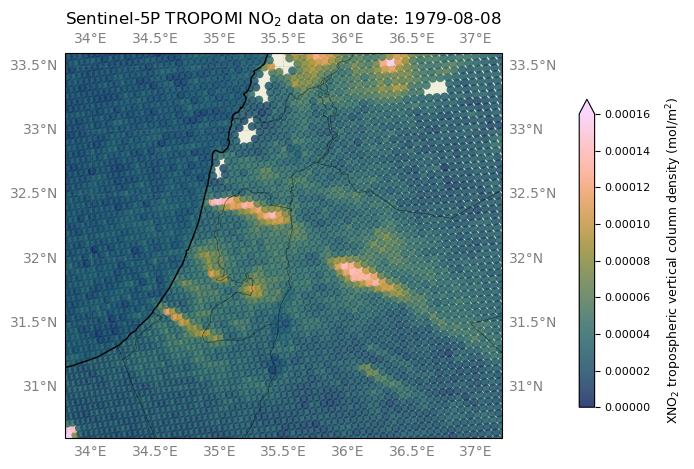

In [14]:

fig = plt.figure(figsize=(8,5))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=0))
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5, alpha=0.5, rasterized=True)
ax.add_feature(cfeature.LAND, rasterized=True)
ax.add_feature(cfeature.OCEAN, rasterized=True)
ax.add_feature(cfeature.LAKES, zorder=-1, rasterized=True)

gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.xlabel_style = {"size": 10, "color": "gray"}
gl.ylabel_style = {"size": 10, "color": "gray"}

extent = [33.8, 37.2, 30.6, 33.6]
ax.set_extent(extent)

# Take only the data from the timeframe
s5p_lon_t = s5p_lon
s5p_lat_t = s5p_lat
s5p_no2_t = s5p_no2
s5p_qa_t = s5p_qa

# Create a mask for the extent
margin = 0.1
extent_mask = (
    (s5p_lon_t >= extent[0]-margin) & (s5p_lon_t <= extent[1]+margin) &
    (s5p_lat_t >= extent[2]-margin) & (s5p_lat_t <= extent[3]+margin)
)

# Apply the mask to all arrays
s5p_lon_t = s5p_lon_t[extent_mask]
s5p_lat_t = s5p_lat_t[extent_mask]
s5p_no2_t = s5p_no2_t[extent_mask]
s5p_qa_t = s5p_qa_t[extent_mask]


# Quality value mask 
q_threshold = 0.75
quality_mask = s5p_qa_t >= q_threshold
s5p_lon_t = s5p_lon_t[quality_mask]
s5p_lat_t = s5p_lat_t[quality_mask]
s5p_no2_t = s5p_no2_t[quality_mask]
s5p_qa_t = s5p_qa_t[quality_mask]



pcm = plt.scatter(s5p_lon_t, s5p_lat_t, c=s5p_no2_t, transform=ccrs.Geodetic(), s=38, vmin=0, vmax=0.00016, alpha=0.8, cmap=cm.batlow, edgecolors='none',)

#plt.scatter([clusters_lon_max[i], clusters_lon_min[i]], [clusters_lat_max[i], clusters_lat_min[i]], c='r', transform=ccrs.Geodetic(), s=50, edgecolors='none')

plt.title("Sentinel-5P TROPOMI NO$_2$ data on date: "+str(datetime.utcfromtimestamp(s5p_time[0]).strftime("%Y-%m-%d")))

# Colorbar
cbar = fig.colorbar(pcm, ax=ax, shrink=0.8, extend='max', anchor=(0.6, 0.4))
cbar.set_label('XNO$_2$ tropospheric vertical column density (mol/m$^2$)', fontsize=9, labelpad=10)
cbar.ax.tick_params(labelsize=8)

date_of_clusters=datetime.utcfromtimestamp(s5p_time[0]).strftime("%Y-%m-%d")
print("Date of clusters:", date_of_clusters)




# Save the figure in vector graphics format
plots_save_path = "/Users/eliaserv/Documents/VSCode_projects/SCEA/plots"
save_path = os.path.join(plots_save_path, 's5p_example_v3.pdf')
plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True)


plt.show()

# Toy Data

In [15]:
def test1data():
    # Lets generate test points
    meshgrid = np.meshgrid(np.linspace(-10,10,42), np.linspace(-2,18,42))
    test_lon = meshgrid[0].flatten()
    test_lat = meshgrid[1].flatten()
    test_no2 = np.cos(test_lon/2)+np.sin(test_lat/4) - np.abs(test_lon)*0.2 + np.random.normal(0,0.6,len(test_lon))
    return test_lon,test_lat,test_no2

test_lon,test_lat,test_no2 = test1data()

#plt.scatter(test_lon,test_lat, c=test_no2)
#plt.title("test1")
#plt.colorbar()
#plt.show()

def test15data():
    # Lets generate test points
    meshgrid = np.meshgrid(np.linspace(-10,10,42), np.linspace(-2,18,42))
    test_lon = meshgrid[0].flatten()
    test_lat = meshgrid[1].flatten()
    test_no2 = np.cos(test_lon/2)+np.sin(test_lat/4) - np.abs(test_lon)*0.2 #+ np.random.normal(0,0.6,len(test_lon))
    return test_lon,test_lat,test_no2

test_lon,test_lat,test_no2 = test15data()

#plt.scatter(test_lon,test_lat, c=test_no2)
#plt.title("test1.5")
#plt.colorbar()
#plt.show()

def test2data():
    # Lets generate harder test points
    meshgrid = np.meshgrid(np.linspace(-25,35,35), np.linspace(-10,45,70))
    test2_lon = meshgrid[0].flatten()
    test2_lat = meshgrid[1].flatten()
    test2_no2 = (np.sin(test2_lon/3)+np.sin(test2_lat/4))/(0.05*np.abs(test2_lon)+1) + np.random.normal(0,0.6,len(test2_lon)) 

    # Remove 20% of the points randomly
    points_to_remove = np.random.choice(len(test2_no2), int(len(test2_no2)*0.2), replace=False)
    test2_lon = np.delete(test2_lon, points_to_remove)
    test2_lat = np.delete(test2_lat, points_to_remove)
    test2_no2 = np.delete(test2_no2, points_to_remove)
    return test2_lon,test2_lat,test2_no2

test2_lon,test2_lat,test2_no2 = test2data()

#plt.scatter(test2_lon,test2_lat, c=test2_no2, s=15)
#plt.title("test data2")
#plt.colorbar()
#plt.show()

def test25data():
    # Lets generate harder test points
    meshgrid = np.meshgrid(np.linspace(-25,35,70), np.linspace(-10,45,70))
    test2_lon = meshgrid[0].flatten()
    test2_lat = meshgrid[1].flatten()
    test2_no2 = (np.sin(test2_lon/3)+np.sin(test2_lat/4))/(0.05*np.abs(test2_lon)+1) #+ np.random.normal(0,0.6,len(test2_lon)) 

    # Remove 20% of the points randomly
    #points_to_remove = np.random.choice(len(test2_no2), int(len(test2_no2)*0.2), replace=False)
    #test2_lon = np.delete(test2_lon, points_to_remove)
    #test2_lat = np.delete(test2_lat, points_to_remove)
    #test2_no2 = np.delete(test2_no2, points_to_remove)
    return test2_lon,test2_lat,test2_no2

test2_lon,test2_lat,test2_no2 = test25data()

#plt.scatter(test2_lon,test2_lat, c=test2_no2, s=15)
#plt.title("test data2")
#plt.colorbar()
#plt.show()

def test3data():
    # Lets generate harder test points
    meshgrid = np.meshgrid(np.linspace(-25,35,40), np.linspace(-10,45,80))
    test3_lon = meshgrid[0].flatten()
    test3_lat = meshgrid[1].flatten()
    test3_no2 = (np.sin(test3_lon/3)+np.sin(test3_lat/4))/(0.05*np.abs(test3_lon)+1) + np.random.normal(0,0.5,len(test3_lon))**4

    # Remove 20% of the points randomly
    points_to_remove = np.random.choice(len(test3_no2), int(len(test3_no2)*0.2), replace=False)
    test3_lon = np.delete(test3_lon, points_to_remove)
    test3_lat = np.delete(test3_lat, points_to_remove)
    test3_no2 = np.delete(test3_no2, points_to_remove)
    return test3_lon,test3_lat,test3_no2

test3_lon,test3_lat,test3_no2 = test3data()

#plt.scatter(test3_lon,test3_lat, c=test3_no2, s=15)
#plt.title("test data3")
#plt.colorbar()
#plt.show()

def test4data():
    # Lets generate harder test points
    meshgrid = np.meshgrid(np.linspace(-18,18,55), np.linspace(-18,18,70))
    test4_lon = meshgrid[0].flatten()
    test4_lat = meshgrid[1].flatten()
    test4_no2 = -0.01*test4_lon**4 + 1.3*test4_lon**2 + 12*test4_lon + 100 - 6*test4_lat**2 + 80
    test4_no2[test4_no2<0] = 0
    test4_no2 = test4_no2 + np.random.normal(0,80,len(test4_no2))

    # Remove points in the shape of an ellipse
    a,b = 1,15
    centre = [7,-1] 
    ellipse_equation = ((test4_lon-centre[0])**2/a**2 + (test4_lat-centre[1])**2/b**2)>1
    test4_lon = test4_lon[ellipse_equation]
    test4_lat = test4_lat[ellipse_equation]
    test4_no2 = test4_no2[ellipse_equation]
    return test4_lon,test4_lat,test4_no2

test4_lon,test4_lat,test4_no2 = test4data()

#plt.scatter(test4_lon,test4_lat, c=test4_no2, s=12)
#plt.title("test data4")
#plt.colorbar()
#plt.show()

def test5data():
    from sklearn import datasets
    moons = np.transpose(datasets.make_moons(n_samples=70, noise=0.04)[0])

    meshgrid = np.meshgrid(np.linspace(-2,3,55), np.linspace(-1.5,2,70))
    test5_lon = meshgrid[0].flatten()
    test5_lat = meshgrid[1].flatten()
    test5_no2 = np.ones(len(test5_lon)) 

    for i in range(len(moons[0])):
        test5_no2[np.sqrt((test5_lon-moons[0][i])**2+(test5_lat-moons[1][i])**2)<0.1] = 2
            
    test5_no2 = test5_no2 + np.random.normal(0,0.35,len(test5_no2))
    return test5_lon,test5_lat,test5_no2

test5_lon,test5_lat,test5_no2 = test5data()

#plt.scatter(test5_lon,test5_lat, c=test5_no2)
#plt.colorbar()
#plt.title("test data5")

Found  1  clusters
Found  1  clusters
Found  6  clusters
Found  6  clusters


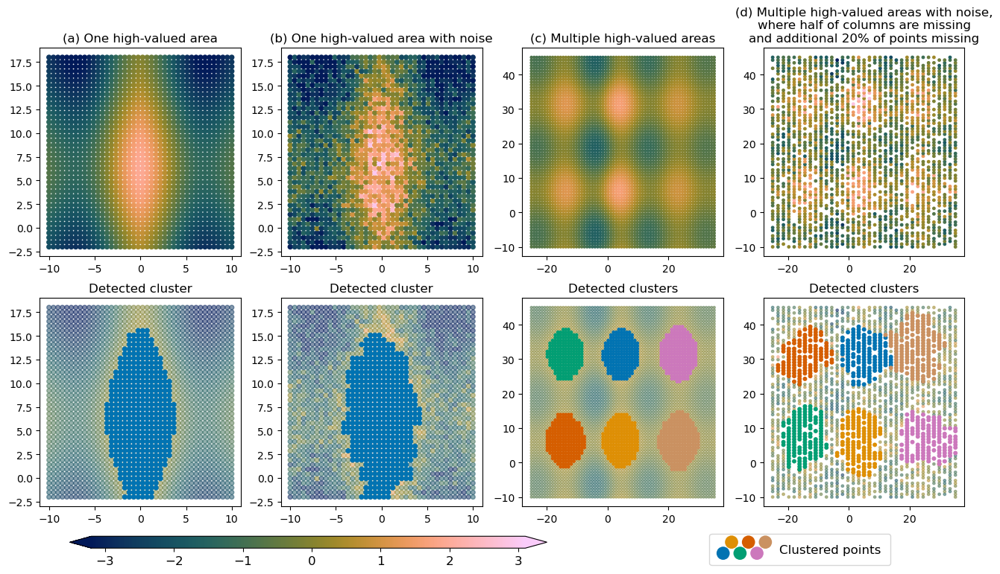

In [16]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.legend_handler import HandlerTuple
import seaborn as sns
colorblind_palette = sns.color_palette("colorblind")
import SCEA as clt

test_lon,test_lat,test_no2 = test1data()
test15_lon,test15_lat,test15_no2 = test15data()
test2_lon,test2_lat,test2_no2 = test2data()
test25_lon,test25_lat,test25_no2 = test25data()


# Clusterings
clt1 = clt.SCEA(np.transpose([test_lon, test_lat]), test_no2, stds=2.2, radius_func_sigmas_threshold=1, local_box_size=0)
clt15 = clt.SCEA(np.transpose([test15_lon, test15_lat]), test15_no2, stds=2, radius_func_sigmas_threshold=1, local_box_size=0)
clt2 = clt.SCEA(np.transpose([test2_lon, test2_lat]), test2_no2, stds=2.3, radius_func_sigmas_threshold=1.2, local_box_size=0)
clt25 = clt.SCEA(np.transpose([test25_lon, test25_lat]), test25_no2, stds=1.5, radius_func_sigmas_threshold=1.2, local_box_size=0)


# Plottings

vmin=-3.2
vmax=3.1
fontsize=12
s=18

scatters = []

fig, axs = plt.subplots(2,4, figsize=(16,8))

ax = axs[0,0]
ax.scatter(test15_lon, test15_lat, c=test15_no2, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
ax.set_title("(a) One high-valued area",fontsize=fontsize)

ax = axs[1,0]
ax.scatter(test15_lon, test15_lat, c=test15_no2, alpha=0.5, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
ax.set_title("Detected cluster",fontsize=fontsize)
for i in np.unique(clt1):
    if i==0: continue
    ax.scatter(test15_lon[clt15==i], test15_lat[clt15==i],c=[colorblind_palette[0]]*len(test15_lat[clt15==i]), alpha=1, edgecolors='none', s=26)
#

ax = axs[0,1]
pcm = ax.scatter(test_lon, test_lat, c=test_no2, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
ax.set_title("(b) One high-valued area with noise",fontsize=fontsize)

ax = axs[1,1]
ax.scatter(test_lon, test_lat, c=test_no2, alpha=0.5, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
ax.set_title("Detected cluster",fontsize=fontsize)
for i in np.unique(clt1):
    if i==0: continue
    ax.scatter(test_lon[clt1==i], test_lat[clt1==i],c=[colorblind_palette[0]]*len(test_lat[clt1==i]), alpha=1, edgecolors='none', s=26)


ax = axs[0,2]
pcm = ax.scatter(test25_lon, test25_lat, c=test25_no2, cmap=cmc.batlow, s=5,vmin=vmin, vmax=vmax)
ax.set_title("(c) Multiple high-valued areas",fontsize=fontsize)

ax = axs[1,2]
ax.scatter(test25_lon, test25_lat, c=test25_no2, alpha=0.5, cmap=cmc.batlow,s=5, vmin=vmin, vmax=vmax)
ax.set_title("Detected clusters",fontsize=fontsize)
cluster_points_lon = []
cluster_points_lat = []
colours = []
for i in np.unique(clt25):
    i=int(i)
    if i==0: continue
    cluster_points_lon.extend(test25_lon[clt25==i])
    cluster_points_lat.extend(test25_lat[clt25==i])
    colours.extend([colorblind_palette[i-1]]*len(test25_lon[clt25==i]))

ax.scatter(cluster_points_lon, cluster_points_lat, alpha=1, edgecolors='none', s=12, label="Clustered points", c=colours)


ax = axs[0,3]
pcm = ax.scatter(test2_lon, test2_lat, c=test2_no2, cmap=cmc.batlow, s=6,vmin=vmin, vmax=vmax)
ax.set_title("(d) Multiple high-valued areas with noise,\nwhere half of columns are missing\nand additional 20% of points missing",fontsize=fontsize)



ax = axs[1,3]
ax.scatter(test2_lon, test2_lat, c=test2_no2, alpha=0.5, cmap=cmc.batlow,s=6, vmin=vmin, vmax=vmax)
ax.set_title("Detected clusters",fontsize=fontsize)

cluster_points_lon = []
cluster_points_lat = []
colours = []
for i in np.unique(clt2):
    i=int(i)
    if i==0: continue
    cluster_points_lon.extend(test2_lon[clt2==i])
    cluster_points_lat.extend(test2_lat[clt2==i])
    colours.extend([colorblind_palette[i-1]]*len(test2_lon[clt2==i]))
    # Add one point to the beginning of the list to get it properly in Legend
    cluster_points_lon.insert(0,test2_lon[clt2==i][0])
    cluster_points_lat.insert(0,test2_lat[clt2==i][0])
    colours.insert(i-1,colorblind_palette[i-1])

    
ax.scatter(cluster_points_lon, cluster_points_lat, alpha=1, edgecolors='none', s=18, label="Clustered points", c=colours)

# Legend
plt.legend(bbox_to_anchor=(-0.3, -0.1),loc='upper left', fontsize=fontsize, labelspacing=1.3, markerscale=3, handlelength=4,handleheight=1,borderpad=0.8,scatterpoints=6, scatteryoffsets=[0,1,0,1,0,1,0])


# Colorbar
cax = fig.add_axes([0.15, 0.04, 0.4, 0.02])
cbar = fig.colorbar(pcm, cax=cax, shrink=1, extend='both', orientation='horizontal')
cbar.ax.tick_params(labelsize=fontsize)  # Set fontsize to 10


# Save the figure in vector graphics format
save_path = os.path.join(plots_save_path, 'toy_data1.pdf')
plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True, ) 

plt.show()

Found  6  clusters
Found  6  clusters


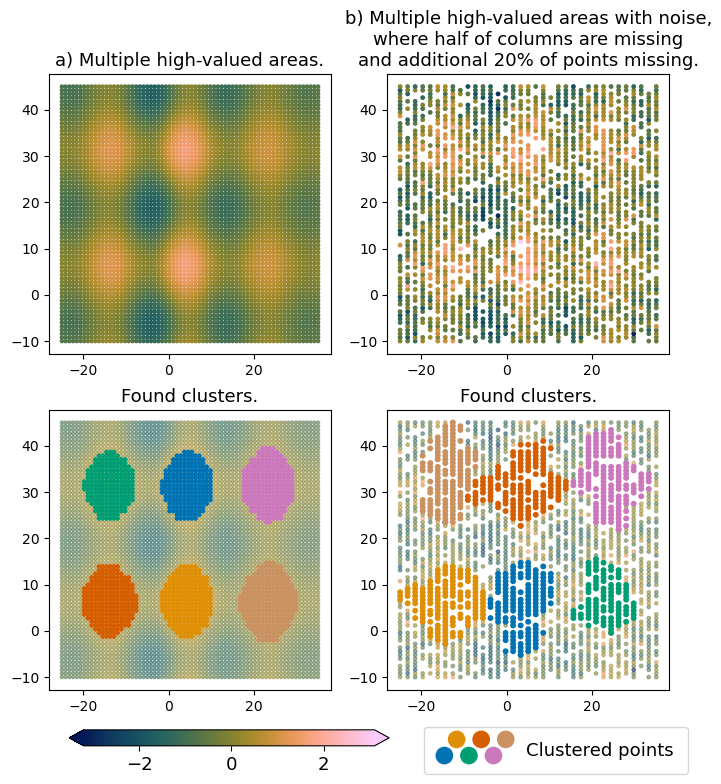

In [17]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.legend_handler import HandlerTuple
import seaborn as sns
colorblind_palette = sns.color_palette("colorblind")
import SCEA as clt

test_lon,test_lat,test_no2 = test1data()
test15_lon,test15_lat,test15_no2 = test15data()
test2_lon,test2_lat,test2_no2 = test2data()
test25_lon,test25_lat,test25_no2 = test25data()


# Clusterings
#clt1 = clt.SCEA(np.transpose([test_lon, test_lat]), test_no2, stds=2.2, radius_func_sigmas_threshold=1, local_box_size=0)
#clt15 = clt.SCEA(np.transpose([test15_lon, test15_lat]), test15_no2, stds=2, radius_func_sigmas_threshold=1, local_box_size=0)
clt2 = clt.SCEA(np.transpose([test2_lon, test2_lat]), test2_no2, stds=2.3, radius_func_sigmas_threshold=1.2, local_box_size=0)
clt25 = clt.SCEA(np.transpose([test25_lon, test25_lat]), test25_no2, stds=1.5, radius_func_sigmas_threshold=1.2, local_box_size=0)


# Plottings

vmin=-3.2
vmax=3.1
fontsize=13
s=18

scatters = []

fig, axs = plt.subplots(2,2, figsize=(8,8))

#ax = axs[0,0]
#ax.scatter(test15_lon, test15_lat, c=test15_no2, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
#ax.set_title("a) One high-valued area.",fontsize=fontsize)

#ax = axs[1,0]
#ax.scatter(test15_lon, test15_lat, c=test15_no2, alpha=0.5, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
#ax.set_title("Found cluster.",fontsize=fontsize)
#for i in np.unique(clt1):
#    if i==0: continue
#    ax.scatter(test15_lon[clt15==i], test15_lat[clt15==i],c=[colorblind_palette[0]]*len(test15_lat[clt15==i]), alpha=1, edgecolors='none', s=26)


#ax = axs[0,1]
#pcm = ax.scatter(test_lon, test_lat, c=test_no2, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
#ax.set_title("b) One high-valued area with noise.",fontsize=fontsize)
#
#ax = axs[1,1]
#ax.scatter(test_lon, test_lat, c=test_no2, alpha=0.5, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
#ax.set_title("Found cluster.",fontsize=fontsize)
#for i in np.unique(clt1):
#    if i==0: continue
#    ax.scatter(test_lon[clt1==i], test_lat[clt1==i],c=[colorblind_palette[0]]*len(test_lat[clt1==i]), alpha=1, edgecolors='none', s=26)


ax = axs[0,0]
pcm = ax.scatter(test25_lon, test25_lat, c=test25_no2, cmap=cmc.batlow, s=5,vmin=vmin, vmax=vmax)
ax.set_title("a) Multiple high-valued areas.",fontsize=fontsize)

ax = axs[1,0]
ax.scatter(test25_lon, test25_lat, c=test25_no2, alpha=0.5, cmap=cmc.batlow,s=5, vmin=vmin, vmax=vmax)
ax.set_title("Found clusters.",fontsize=fontsize)
cluster_points_lon = []
cluster_points_lat = []
colours = []
for i in np.unique(clt25):
    i=int(i)
    if i==0: continue
    cluster_points_lon.extend(test25_lon[clt25==i])
    cluster_points_lat.extend(test25_lat[clt25==i])
    colours.extend([colorblind_palette[i-1]]*len(test25_lon[clt25==i]))

ax.scatter(cluster_points_lon, cluster_points_lat, alpha=1, edgecolors='none', s=12, label="Clustered points", c=colours)


ax = axs[0,1]
pcm = ax.scatter(test2_lon, test2_lat, c=test2_no2, cmap=cmc.batlow, s=6,vmin=vmin, vmax=vmax)
ax.set_title("b) Multiple high-valued areas with noise,\nwhere half of columns are missing\nand additional 20% of points missing.",fontsize=fontsize)

ax = axs[1,1]
ax.scatter(test2_lon, test2_lat, c=test2_no2, alpha=0.5, cmap=cmc.batlow,s=6, vmin=vmin, vmax=vmax)
ax.set_title("Found clusters.",fontsize=fontsize)

cluster_points_lon = []
cluster_points_lat = []
colours = []
for i in np.unique(clt2):
    i=int(i)
    if i==0: continue
    cluster_points_lon.extend(test2_lon[clt2==i])
    cluster_points_lat.extend(test2_lat[clt2==i])
    colours.extend([colorblind_palette[i-1]]*len(test2_lon[clt2==i]))
    # Add one point to the beginning of the list to get it properly in Legend
    cluster_points_lon.insert(0,test2_lon[clt2==i][0])
    cluster_points_lat.insert(0,test2_lat[clt2==i][0])
    colours.insert(i-1,colorblind_palette[i-1])

    
ax.scatter(cluster_points_lon, cluster_points_lat, alpha=1, edgecolors='none', s=18, label="Clustered points", c=colours)

# Legend
plt.legend(bbox_to_anchor=(0.1, -0.1),loc='upper left', fontsize=fontsize, labelspacing=1.3, markerscale=3, handlelength=4,handleheight=1,borderpad=0.8,scatterpoints=6, scatteryoffsets=[0,1,0,1,0,1,0])


# Colorbar
cax = fig.add_axes([0.15, 0.04, 0.4, 0.02])
cbar = fig.colorbar(pcm, cax=cax, shrink=1, extend='both', orientation='horizontal')
cbar.ax.tick_params(labelsize=fontsize)  # Set fontsize to 10


# Save the figure in vector graphics format
save_path = os.path.join(plots_save_path, 'toy_data05.png')
plt.savefig(save_path, format='png', bbox_inches='tight', transparent=True, ) 

plt.show()

Found  1  clusters
Found  2  clusters


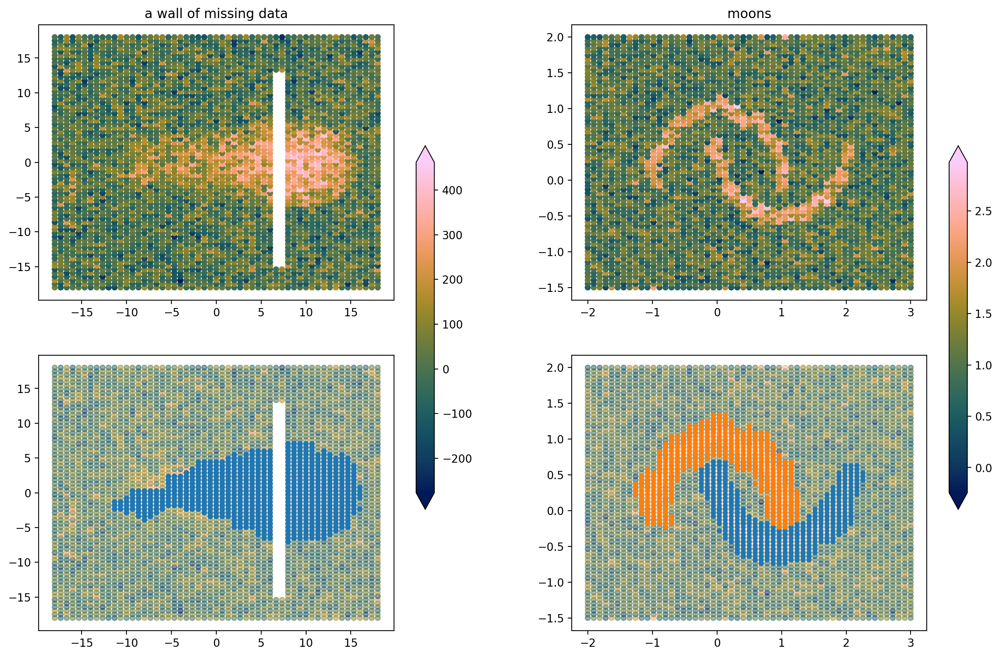

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming test4data() and test5data() functions are defined somewhere else
test4_lon,test4_lat,test4_no2 = test4data()
test5_lon,test5_lat,test5_no2 = test5data()

# Assuming clt.density_based_clustering_with_varying_radius() function is defined somewhere else
clt4 = clt.SCEA(np.transpose([test4_lon, test4_lat]), test4_no2, stds=3.5, radius_func_sigmas_threshold=1, local_box_size=0)
clt5 = clt.SCEA(np.transpose([test5_lon, test5_lat]), test5_no2, stds=3.5, radius_func_sigmas_threshold=1.3, local_box_size=0)

fig, axs = plt.subplots(2,2, figsize=(16,10), dpi=200)

# First column
ax = axs[0,0]
sc1 = ax.scatter(test4_lon, test4_lat, c=test4_no2, s=20, cmap=cm.batlow)
ax.set_title("a wall of missing data")

ax = axs[1,0]
sc2 = ax.scatter(test4_lon, test4_lat, c=test4_no2, s=20, alpha=0.5, cmap=cmc.batlow)
for i in np.unique(clt4):
    if i==0: continue
    ax.scatter(test4_lon[clt4==i], test4_lat[clt4==i], alpha=1, edgecolors='none', s=25)

# Colorbar for first column
fig.colorbar(sc1, ax=axs[:, 0], shrink=0.6, extend='both')

# Second column
ax = axs[0,1]
sc3 = ax.scatter(test5_lon, test5_lat, c=test5_no2, s=20, cmap=cm.batlow)
ax.set_title("moons")

ax = axs[1,1]
sc4 = ax.scatter(test5_lon, test5_lat, c=test5_no2, alpha=0.5, s=20, cmap=cm.batlow)
for i in np.unique(clt5):
    if i==0: continue
    ax.scatter(test5_lon[clt5==i], test5_lat[clt5==i], alpha=1, edgecolors='none', s=20)

# Colorbar for second column
fig.colorbar(sc3, ax=axs[:, 1], shrink=0.6, extend='both')



# Save the figure in vector graphics format
save_path = os.path.join(plots_save_path, 'toy_data2.pdf')
plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True, ) 

plt.show()

Found  1  clusters
Found  2  clusters


/var/folders/p6/59vbd6tj4ts7d0rh5n3n2ms4rrn7dd/T/ipykernel_64423/361964218.py:35: UserWarning: Adding colorbar to a different Figure <Figure size 3200x2000 with 6 Axes> than <Figure size 800x1100 with 5 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(sc1, ax=axs[:, 0], shrink=0.6, extend='both', anchor=(0.2, 1.7), orientation='horizontal')
/var/folders/p6/59vbd6tj4ts7d0rh5n3n2ms4rrn7dd/T/ipykernel_64423/361964218.py:73: UserWarning: Adding colorbar to a different Figure <Figure size 3200x2000 with 6 Axes> than <Figure size 800x1100 with 6 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(sc3, ax=axs[:, 1], shrink=0.6, extend='both', anchor=(0.9, 1.7), orientation='horizontal')


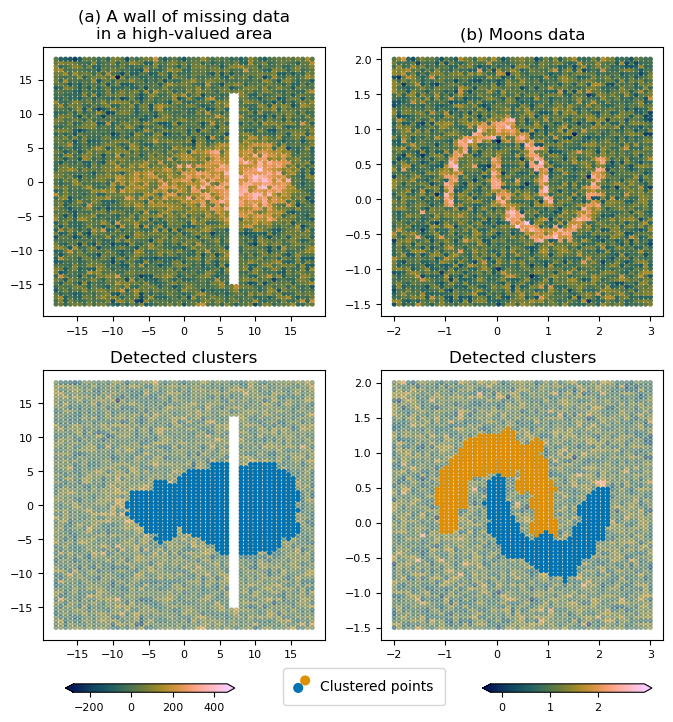

In [19]:
test4_lon,test4_lat,test4_no2 = test4data()
test5_lon,test5_lat,test5_no2 = test5data()

# Clusterings
clt4 = clt.SCEA(np.transpose([test4_lon, test4_lat]), test4_no2, stds=3.6, radius_func_sigmas_threshold=1.0, local_box_size=0, max_points_in_start_radius=7)
clt5 = clt.SCEA(np.transpose([test5_lon, test5_lat]), test5_no2, stds=3.6, radius_func_sigmas_threshold=1.0, local_box_size=0, max_points_in_start_radius=5)

tickfontsize=8
fontsize=12
s=7
s_cluster=12

fig, axs = plt.subplots(2,2, figsize=(8,11))


ax = axs[0,0]
ax.scatter(test4_lon, test4_lat, c=test4_no2, s=s, cmap=cmc.batlow)
ax.set_title("(a) A wall of missing data\nin a high-valued area", fontsize=fontsize)

# axis ticklabel fontsize
axs[0,0].tick_params(axis='both', which='major', labelsize=tickfontsize)


ax = axs[1,0]
ax.scatter(test4_lon, test4_lat, c=test4_no2, s=s, alpha=0.5, cmap=cmc.batlow)
for i in np.unique(clt4):
    i = int(i)
    if i==0: continue
    ax.scatter(test4_lon[clt4==i], test4_lat[clt4==i], c=[colorblind_palette[i-1]]*len(test4_lat[clt4==i]), alpha=1, edgecolors='none', s=s_cluster)
ax.set_title("Detected clusters",fontsize=fontsize)
axs[1,0].tick_params(axis='both', which='major', labelsize=tickfontsize)


# Colorbar for first column
cbar = fig.colorbar(sc1, ax=axs[:, 0], shrink=0.6, extend='both', anchor=(0.2, 1.7), orientation='horizontal')
cbar.ax.tick_params(labelsize=tickfontsize)        # tick label font size


ax = axs[0,1]
ax.scatter(test5_lon, test5_lat, c=test5_no2, s=s, cmap=cmc.batlow)
ax.set_title("(b) Moons data", fontsize=fontsize)
axs[0,1].tick_params(axis='both', which='major', labelsize=tickfontsize)


#ax = axs[1,1]
#ax.scatter(test5_lon, test5_lat, c=test5_no2, alpha=0.5, s=20, cmap=cmc.batlow)
#for i in np.unique(clt5):
#    if i==0: continue
#    ax.scatter(test5_lon[clt5==i], test5_lat[clt5==i], alpha=1, edgecolors='none', s=20)
    
ax = axs[1,1]
ax.scatter(test5_lon, test5_lat, c=test5_no2, alpha=0.5, s=s, cmap=cmc.batlow)
cluster_points_lon = []
cluster_points_lat = []
colours = []
for i in np.unique(clt5):
    i=int(i)
    if i==0: continue
    cluster_points_lon.extend(test5_lon[clt5==i])
    cluster_points_lat.extend(test5_lat[clt5==i])
    colours.extend([colorblind_palette[i-1]]*len(test5_lon[clt5==i]))
    # Add one point to the beginning of the list to get it properly in Legend
    cluster_points_lon.insert(0,test5_lon[clt5==i][0])
    cluster_points_lat.insert(0,test5_lat[clt5==i][0])
    colours.insert(i-1,colorblind_palette[i-1])
ax.scatter(cluster_points_lon, cluster_points_lat, alpha=1, edgecolors='none', s=s_cluster, label="Clustered points", c=colours)
ax.set_title("Detected clusters",fontsize=fontsize)
axs[1,1].tick_params(axis='both', which='major', labelsize=tickfontsize)
    
    

# Colorbar for second column
cbar = fig.colorbar(sc3, ax=axs[:, 1], shrink=0.6, extend='both', anchor=(0.9, 1.7), orientation='horizontal')
cbar.ax.tick_params(labelsize=tickfontsize)        # tick label font size

    
# Legend
#plt.legend([tuple(scatters)], ['clustered points'],handler_map={tuple: HandlerTuple(ndivide=None,pad=1.1)}, bbox_to_anchor=(1.05, 2.1),loc='upper left', fontsize=14, labelspacing=1.2, markerscale=1.2)
plt.legend(bbox_to_anchor=(0.25, -0.08), fontsize=10, labelspacing=1.3, markerscale=2.1, handlelength=1.1,handleheight=1,borderpad=0.8,scatterpoints=2, scatteryoffsets=[0.2,0.8,0,1,0,1,0])




# Save the figure in vector graphics format
save_path = os.path.join('/Users/eliaserv/Documents/VSCode_projects/SCEA/plots', 'toy_data2.pdf')
plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True, ) 

    
plt.show()


Found  1  clusters
Found  1  clusters
Found  5  clusters
Found  6  clusters


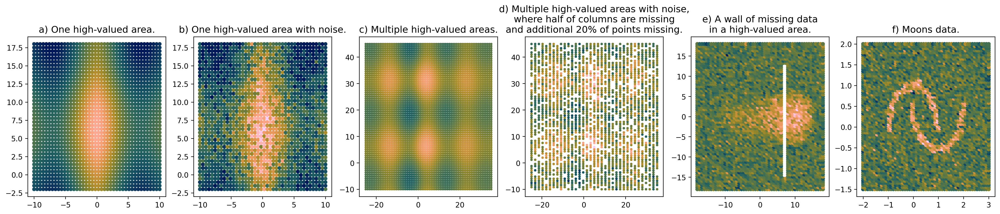

In [20]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.legend_handler import HandlerTuple
import seaborn as sns
colorblind_palette = sns.color_palette("colorblind")
import SCEA as clt

test_lon,test_lat,test_no2 = test1data()
test15_lon,test15_lat,test15_no2 = test15data()
test2_lon,test2_lat,test2_no2 = test2data()
test25_lon,test25_lat,test25_no2 = test25data()


# Clusterings
clt1 = clt.SCEA(np.transpose([test_lon, test_lat]), test_no2, stds=2.2, radius_func_sigmas_threshold=1, local_box_size=0)
clt15 = clt.SCEA(np.transpose([test15_lon, test15_lat]), test15_no2, stds=2, radius_func_sigmas_threshold=1, local_box_size=0)
clt2 = clt.SCEA(np.transpose([test2_lon, test2_lat]), test2_no2, stds=2.3, radius_func_sigmas_threshold=1.2, local_box_size=0)
clt25 = clt.SCEA(np.transpose([test25_lon, test25_lat]), test25_no2, stds=1.5, radius_func_sigmas_threshold=1.2, local_box_size=0)


# Plottings

vmin=-3.2
vmax=3.1
fontsize=13
s=18

scatters = []

fig, axs = plt.subplots(1,6, figsize=(24,4), dpi=200)

ax = axs[0]
ax.scatter(test15_lon, test15_lat, c=test15_no2, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
ax.set_title("a) One high-valued area.",fontsize=fontsize)



ax = axs[1]
pcm = ax.scatter(test_lon, test_lat, c=test_no2, cmap=cmc.batlow, vmin=vmin, vmax=vmax, s=s)
ax.set_title("b) One high-valued area with noise.",fontsize=fontsize)


ax = axs[2]
pcm = ax.scatter(test25_lon, test25_lat, c=test25_no2, cmap=cmc.batlow, s=5,vmin=vmin, vmax=vmax)
ax.set_title("c) Multiple high-valued areas.",fontsize=fontsize)


ax = axs[3]   
pcm = ax.scatter(test2_lon, test2_lat, c=test2_no2, cmap=cmc.batlow, s=6,vmin=vmin, vmax=vmax)
ax.set_title("d) Multiple high-valued areas with noise,\nwhere half of columns are missing\nand additional 20% of points missing.",fontsize=fontsize)


ax = axs[4]
ax.scatter(test4_lon, test4_lat, c=test4_no2, s=20, cmap=cmc.batlow)
ax.set_title("e) A wall of missing data\nin a high-valued area.", fontsize=fontsize)

ax = axs[5]
ax.scatter(test5_lon, test5_lat, c=test5_no2, s=20, cmap=cmc.batlow)
ax.set_title("f) Moons data.", fontsize=fontsize)


# Legend
#plt.legend(bbox_to_anchor=(-0.3, -0.1),loc='upper left', fontsize=fontsize, labelspacing=1.3, markerscale=3, handlelength=4,handleheight=1,borderpad=0.8,scatterpoints=6, scatteryoffsets=[0,1,0,1,0,1,0])


# Colorbar
#cax = fig.add_axes([0.15, 0.04, 0.4, 0.02])
#cbar = fig.colorbar(pcm, cax=cax, shrink=1, extend='both', orientation='horizontal')
#cbar.ax.tick_params(labelsize=fontsize)  # Set fontsize to 10


# Save the figure in vector graphics format
save_path = os.path.join(plots_save_path, 'sup_toy_data1.pdf')
plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True, ) 

plt.show()

# More examples of SCEA on real world data

In [21]:
file = s5p_files[0]
ds = xr.open_dataset(s5p_filepath+file, group="PRODUCT")

ds


<xarray.Dataset> Size: 331MB
Dimensions:                                               (time: 1,
                                                           scanline: 4173,
                                                           ground_pixel: 450,
                                                           layer: 34,
                                                           vertices: 2,
                                                           corner: 4,
                                                           polynomial_exponents: 6,
                                                           intensity_offset_polynomial_exponents: 1)
Coordinates:
  * scanline                                              (scanline) float64 33kB ...
  * ground_pixel                                          (ground_pixel) float64 4kB ...
  * time                                                  (time) datetime64[ns] 8B ...
  * corner                                                (corner) float64 32B ...
  * polynomial_exponents                                  (polynomial_exponents) float64 48B ...
  * intensity_offset_polynomial_exponents                 (intensity_offset_polynomial_exponents) float64 8B ...
  * layer                                                 (layer) float64 272B ...
  * vertices                                              (vertices) float64 16B ...
    latitude                                              (time, scanline, ground_pixel) float32 8MB ...
    longitude                                             (time, scanline, ground_pixel) float32 8MB ...
Data variables:
    delta_time                                            (time, scanline) datetime64[ns] 33kB ...
    time_utc                                              (time, scanline) object 33kB ...
    qa_value                                              (time, scanline, ground_pixel) float32 8MB ...
    nitrogendioxide_tropospheric_column                   (time, scanline, ground_pixel) float32 8MB ...
    nitrogendioxide_tropospheric_column_precision         (time, scanline, ground_pixel) float32 8MB ...
    nitrogendioxide_tropospheric_column_precision_kernel  (time, scanline, ground_pixel) float32 8MB ...
    averaging_kernel                                      (time, scanline, ground_pixel, layer) float32 255MB ...
    air_mass_factor_troposphere                           (time, scanline, ground_pixel) float32 8MB ...
    air_mass_factor_total                                 (time, scanline, ground_pixel) float32 8MB ...
    tm5_tropopause_layer_index                            (time, scanline, ground_pixel) float64 15MB ...
    tm5_constant_a                                        (layer, vertices) float32 272B ...
    tm5_constant_b                                        (layer, vertices) float32 272B ...

S5P_OFFL_L2__NO2____20240612T102411_20240612T120541_34533_03_020600_20240615T102252.nc
Found  19  clusters
S5P_OFFL_L2__NO2____20240605T091410_20240605T105540_34433_03_020600_20240611T042040.nc
Found  22  clusters


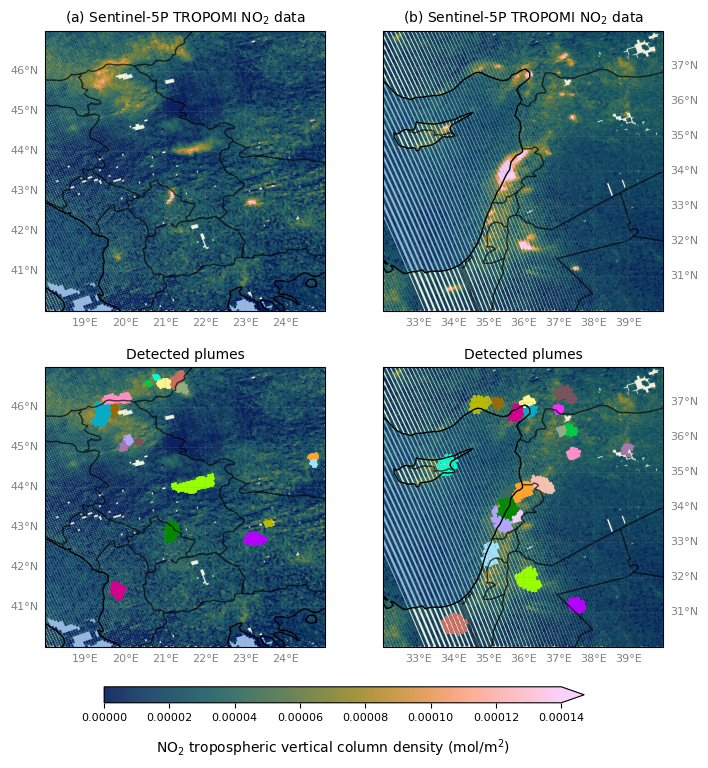

In [22]:
file1 = 112
file2 = 45
stds = 3.5
radius_func_sigmas_threshold = 2.2
max_points_in_start_radius = 6
local_box_size = 2

# import cluster as clt

fig, axs = plt.subplots(
    2, 2, figsize=(8, 8), subplot_kw={"projection": ccrs.PlateCarree(),}
)

fontsize = None

# ====== First scene ======
s = 1

ax = axs[0, 0]

extent1 = [18, 25, 40, 47]
file = s5p_files[file1]
ds = xr.open_dataset(s5p_filepath + file, group="PRODUCT")

# Print file date
print(file)


gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.left_labels = True
gl.bottom_labels = True
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {"size": 8, "color": "gray"}
gl.ylabel_style = {"size": 8, "color": "gray"}
ax.set_extent(extent1)

no2 = np.array(ds["nitrogendioxide_tropospheric_column"]).flatten()
lat = np.array(ds["latitude"]).flatten()
lon = np.array(ds["longitude"]).flatten()
qa_value = np.array(ds["qa_value"]).flatten()
qa_mask = qa_value < 0.70
no2[qa_mask] = np.nan
lat[qa_mask] = np.nan
lon[qa_mask] = np.nan
# remove nans
not_nan = ~np.isnan(no2)
no2 = no2[not_nan]
lat = lat[not_nan]
lon = lon[not_nan]
margin = 0
# Remove points outside the extent
in_extent = (
    (lon >= extent1[0] - margin)
    & (lon <= extent1[1] + margin)
    & (lat >= extent1[2] - margin)
    & (lat <= extent1[3] + margin)
)
lon = lon[in_extent]
lat = lat[in_extent]
no2 = no2[in_extent]

# Plot satellite data
pcm = ax.scatter(
    lon,
    lat,
    c=no2,
    transform=ccrs.Geodetic(),
    s=s,
    vmin=0,
    vmax=0.00012,
    alpha=0.9,
    cmap=cm.batlow,
    rasterized=True,
)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=0.7, linewidth=1, rasterized=True)
ax.coastlines(resolution="50m", rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), rasterized=True)
ax.set_title("(a) Sentinel-5P TROPOMI NO$_2$ data", fontsize=fontsize)

# =======

ax = axs[1, 0]


gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.left_labels = True
gl.bottom_labels = True
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {"size": 8, "color": "gray"}
gl.ylabel_style = {"size": 8, "color": "gray"}
ax.set_extent(extent1)

# Plot satellite data
pcm = ax.scatter(
    lon,
    lat,
    c=no2,
    transform=ccrs.Geodetic(),
    s=s,
    vmin=0,
    vmax=0.00012,
    alpha=0.9,
    cmap=cm.batlow,
    rasterized=True,
)


# Clusters
cluster1 = clt.SCEA(
    np.transpose([lon, lat]),
    no2,
    point_value_threshold="stds_from_median",
    stds=stds,
    distance_matrix="euclidean",
    radius_func_sigmas_threshold=radius_func_sigmas_threshold,
    max_points_in_start_radius=max_points_in_start_radius,
    local_box_size=local_box_size,
)

# Plot clusters
for i in np.unique(cluster1):
    i = int(i)
    if i == 0:
        continue
    ax.scatter(
        lon[cluster1 == i],
        lat[cluster1 == i],
        alpha=1,
        edgecolors=cc.cm.glasbey_light.colors[i],
        s=s * 1.3,
        color=cc.cm.glasbey_light.colors[i],
    )

    
ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=0.7, linewidth=1, rasterized=True)
ax.coastlines(resolution="50m", rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), rasterized=True)
ax.set_title("Detected plumes", fontsize=fontsize)


# ======= Second scene ======
s = 1.5

ax = axs[0, 1]


extent2 = [32, 40, 30, 38]
file = s5p_files[file2]
ds = xr.open_dataset(s5p_filepath + file, group="PRODUCT")

print(file)


ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=0.7, linewidth=1, rasterized=True)
ax.coastlines(resolution="50m", rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), rasterized=True)
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.left_labels = False
gl.bottom_labels = True
gl.top_labels = False
gl.right_labels = True
gl.xlabel_style = {"size": 8, "color": "gray"}
gl.ylabel_style = {"size": 8, "color": "gray"}
ax.set_extent(extent2)

no2 = np.array(ds["nitrogendioxide_tropospheric_column"]).flatten()
lat = np.array(ds["latitude"]).flatten()
lon = np.array(ds["longitude"]).flatten()
qa_value = np.array(ds["qa_value"]).flatten()
qa_mask = qa_value < 0.70
no2[qa_mask] = np.nan
lat[qa_mask] = np.nan
lon[qa_mask] = np.nan
# remove nans
not_nan = ~np.isnan(no2)
no2 = no2[not_nan]
lat = lat[not_nan]
lon = lon[not_nan]
margin = 0
# Remove points outside the extent
in_extent = (
    (lon >= extent2[0] - margin)
    & (lon <= extent2[1] + margin)
    & (lat >= extent2[2] - margin)
    & (lat <= extent2[3] + margin)
)
lon = lon[in_extent]
lat = lat[in_extent]
no2 = no2[in_extent]

# Plot satellite data
pcm = ax.scatter(
    lon,
    lat,
    c=no2,
    transform=ccrs.Geodetic(),
    s=s,
    vmin=0,
    vmax=0.00014,
    alpha=0.9,
    cmap=cm.batlow,
    rasterized=True,
)

ax.set_title("(b) Sentinel-5P TROPOMI NO$_2$ data", fontsize=fontsize)

# =====


ax = axs[1, 1]

ax.add_feature(cfeature.BORDERS.with_scale("50m"), alpha=0.7, linewidth=1, rasterized=True)
ax.coastlines(resolution="50m", rasterized=True)
ax.add_feature(cfeature.LAND.with_scale("50m"), rasterized=True)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), rasterized=True)
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color="gray",
    alpha=0.3,
    linestyle="--",
)
gl.xlabel_style = {"size": 8, "color": "gray"}
gl.ylabel_style = {"size": 8, "color": "gray"}
gl.left_labels = False
gl.bottom_labels = True
gl.top_labels = False
gl.right_labels = True
ax.set_extent(extent2)


# Clusters
cluster2 = clt.SCEA(
    np.transpose([lon, lat]),
    no2,
    point_value_threshold="stds_from_median",
    stds=stds,
    distance_matrix="euclidean",
    radius_func_sigmas_threshold=radius_func_sigmas_threshold,
    max_points_in_start_radius=max_points_in_start_radius,
    local_box_size=local_box_size,
)


# Plot satellite data
pcm = ax.scatter(
    lon,
    lat,
    c=no2,
    transform=ccrs.Geodetic(),
    s=s,
    vmin=0,
    vmax=0.00014,
    alpha=0.9,
    cmap=cm.batlow,
    rasterized=True,
)

# Plot clusters with cc.cm.glasbey colors
for i in np.unique(cluster2):
    i = int(i)
    if i == 0:
        continue
    ax.scatter(
        lon[cluster2 == i],
        lat[cluster2 == i],
        alpha=1,
        edgecolors=cc.cm.glasbey_light.colors[i],
        s=s * 1.5,
        color=cc.cm.glasbey_light.colors[i],
    )

ax.set_title("Detected plumes", fontsize=fontsize)


# =====


# =====



cax = fig.add_axes([0.2, 0.04, 0.6, 0.02])
# Colorbar
cbar = fig.colorbar(pcm, cax=cax, shrink=0.6, extend="max", orientation="horizontal")
cbar.ax.tick_params(labelsize=8)  # Set fontsize to 8
cbar.set_label(
    "NO$_2$ tropospheric vertical column density (mol/m$^2$)",
    fontsize=10,
    labelpad=10,
)

# Save the figure in vector graphics format
plots_save_path = "/Users/eliaserv/Documents/VSCode_projects/SCEA/plots"
save_path = os.path.join(plots_save_path, "examples_of_SCEA_on_s5p_v6.pdf")
plt.savefig(save_path, format="pdf", bbox_inches="tight", transparent=True)

plt.show()

Found  37  clusters


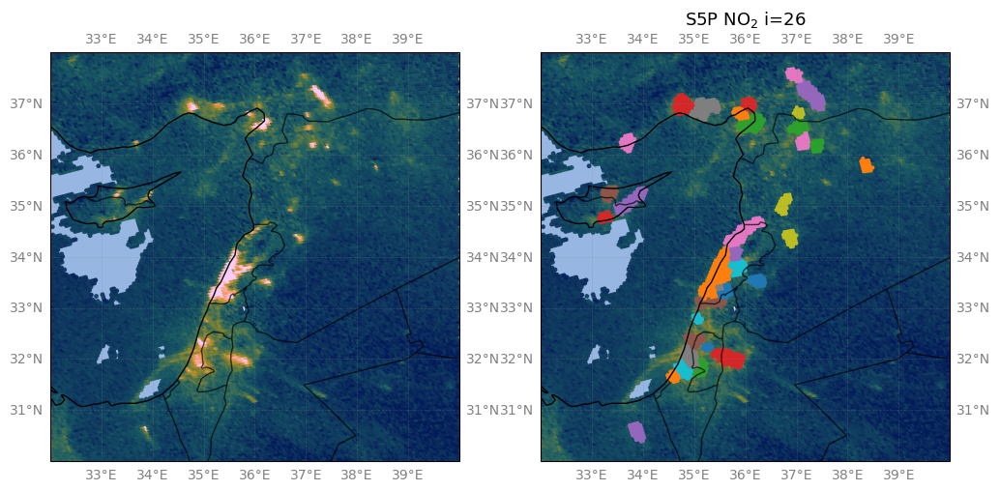

Found  28  clusters


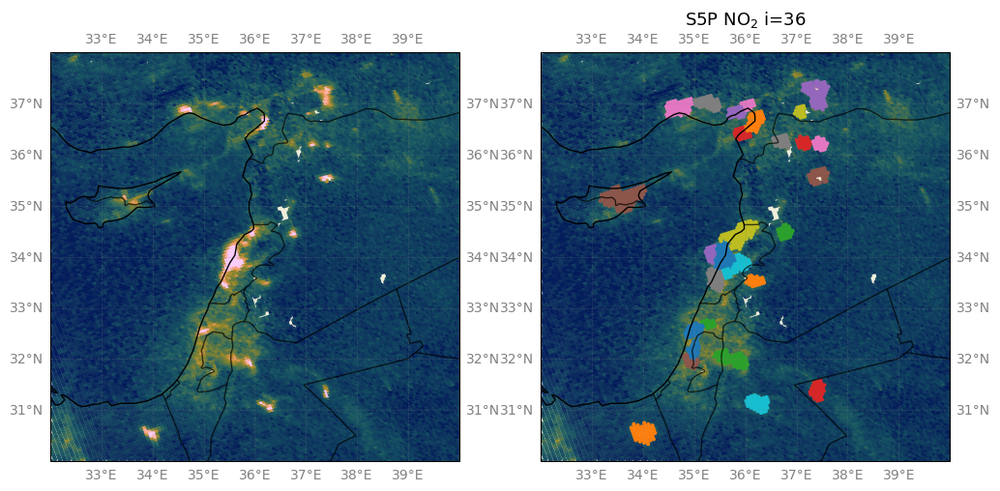

Found  22  clusters


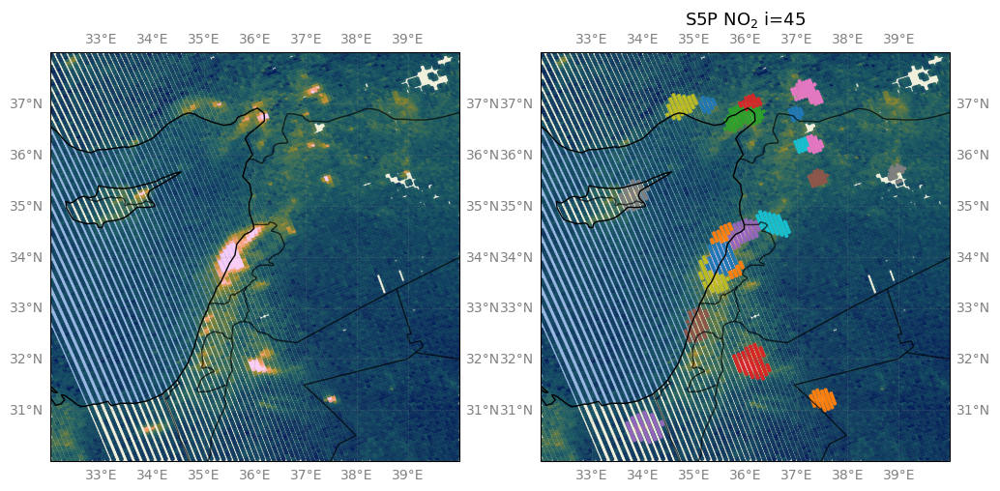

Found  18  clusters


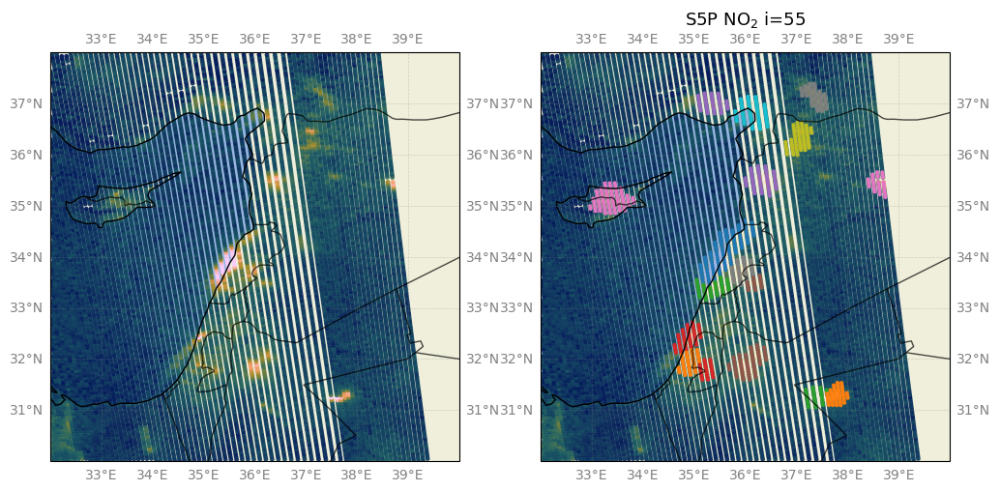

Found  21  clusters


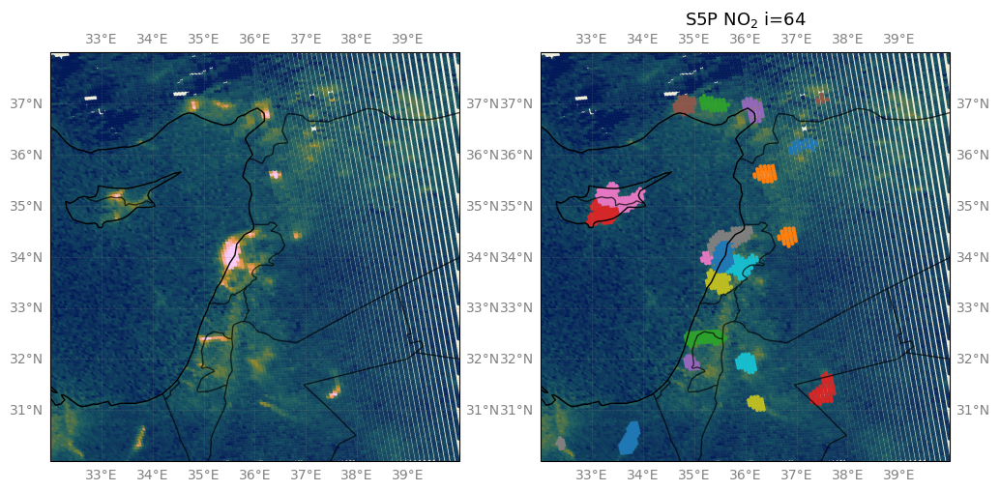

In [23]:

ii = [26,36,45,55,64]

fontsize=13
s=6

for i in ii:
    file = s5p_files[i]
    ds = xr.open_dataset(s5p_filepath+file, group="PRODUCT")


    extent = [32, 40, 30, 38]

    fig, axs = plt.subplots(1,2,figsize=(12,6), subplot_kw={'projection': ccrs.PlateCarree()})

    ax = axs[0]

    ax.add_feature(cfeature.BORDERS.with_scale('50m'), alpha=0.7, linewidth=1)
    ax.coastlines(resolution='50m')
    ax.add_feature(cfeature.LAND.with_scale('50m'))
    ax.add_feature(cfeature.OCEAN.with_scale('50m'))
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color="gray",
        alpha=0.3,
        linestyle="--",
    )
    gl.xlabel_style = {"size": 10, "color": "gray"}
    gl.ylabel_style = {"size": 10, "color": "gray"}
    ax.set_extent(extent)

    file = s5p_files[i]
    ds = xr.open_dataset(s5p_filepath+file, group="PRODUCT")

    no2 = np.array(ds['nitrogendioxide_tropospheric_column']).flatten()
    lat = np.array(ds['latitude']).flatten()
    lon = np.array(ds['longitude']).flatten()
    qa_value = np.array(ds['qa_value']).flatten()
    qa_mask = qa_value < 0.70
    no2[qa_mask] = np.nan
    lat[qa_mask] = np.nan
    lon[qa_mask] = np.nan

    # remove nans
    not_nan = ~np.isnan(no2)
    no2 = no2[not_nan]
    lat = lat[not_nan]
    lon = lon[not_nan]

    margin = 0
    # Remove points outside the extent
    in_extent = (lon >= extent[0]-margin) & (lon <= extent[1]+margin) & (lat >= extent[2]-margin) & (lat <= extent[3]+margin)
    lon = lon[in_extent]
    lat = lat[in_extent]
    no2 = no2[in_extent]

    

    pcm = ax.scatter(lon, lat, c=no2, transform=ccrs.Geodetic(), s=s, vmin=0, vmax=0.00015, alpha=0.9, cmap=cm.batlow)


    ax = axs[1]
   

    ax.set_title(f"S5P NO$_2$ i={i}", fontsize=fontsize)

    ax.add_feature(cfeature.BORDERS.with_scale('50m'), alpha=0.7, linewidth=1)
    ax.coastlines(resolution='50m')
    ax.add_feature(cfeature.LAND.with_scale('50m'))
    ax.add_feature(cfeature.OCEAN.with_scale('50m'))
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color="gray",
        alpha=0.3,
        linestyle="--",
    )
    gl.xlabel_style = {"size": 10, "color": "gray"}
    gl.ylabel_style = {"size": 10, "color": "gray"}
    ax.set_extent(extent)

    # cluster
    # Clusters
    cluster1 = clt.SCEA(
        np.transpose([lon, lat]),
        no2,
        point_value_threshold="stds_from_median",
        stds=3.5,
        distance_matrix="euclidean",
        radius_func_sigmas_threshold=2.2,
        max_points_in_start_radius=6,
        local_box_size=2,
    )


    pcm = ax.scatter(lon, lat, c=no2, transform=ccrs.Geodetic(), s=s, vmin=0, vmax=0.00015, alpha=0.9, cmap=cm.batlow)

    # Plot clusters
    for i in np.unique(cluster1):
        i = int(i)
        if i==0: continue
        ax.scatter(lon[cluster1==i], lat[cluster1==i], alpha=1, edgecolors='none', s=s*1.5)

    plt.show()
    ds.close()


Found  10  clusters


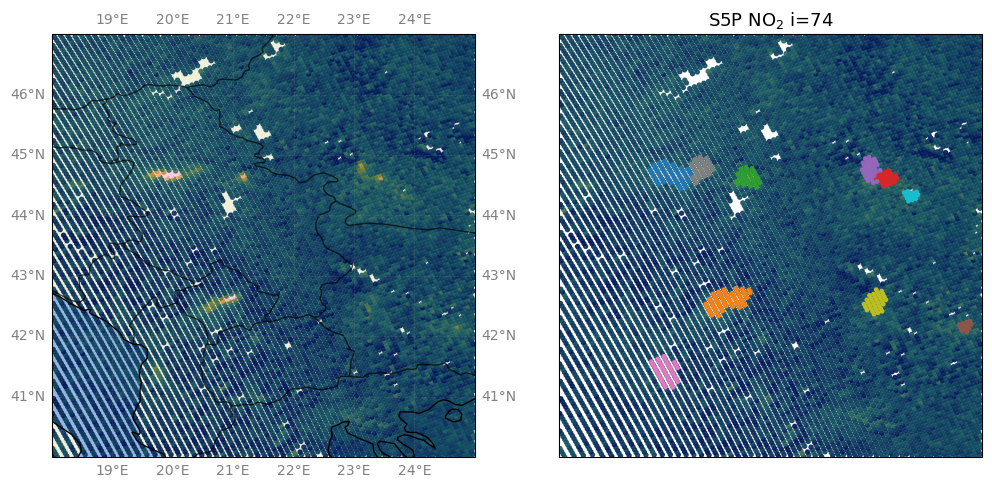

Found  6  clusters


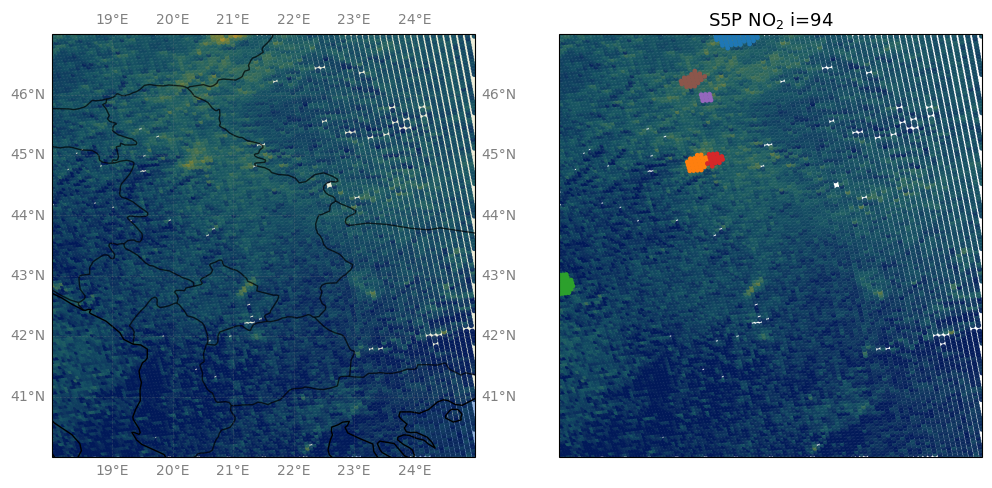

Found  19  clusters


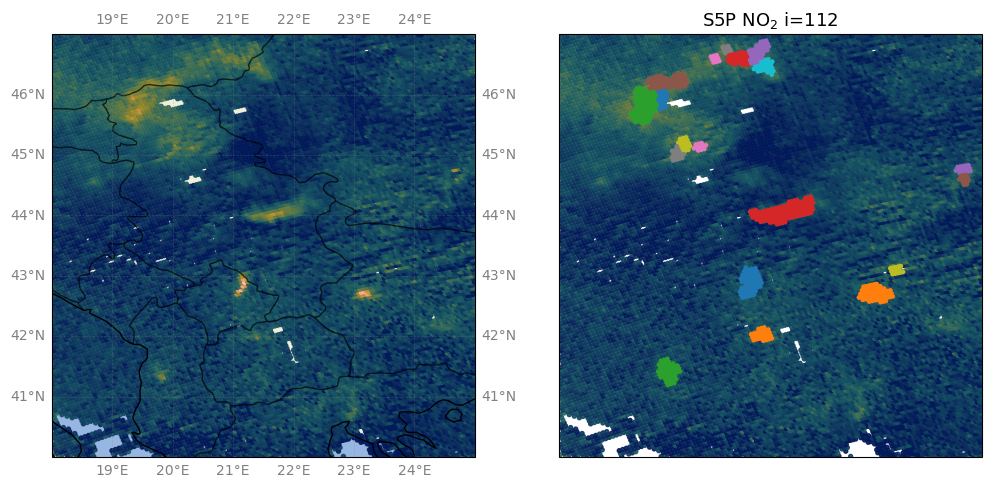

In [24]:
i=6
i=16
i=26
i=37
i=46

#ii = [6,16,26,37,46]
ii = [74,94, 112]
fontsize=13
s=8

for i in ii:
    file = s5p_files[i]
    ds = xr.open_dataset(s5p_filepath+file, group="PRODUCT")


    extent = [18, 25, 40, 47]

    fig, axs = plt.subplots(1,2,figsize=(12,6), subplot_kw={'projection': ccrs.PlateCarree()})

    ax = axs[0]

    ax.add_feature(cfeature.BORDERS.with_scale('50m'), alpha=0.7, linewidth=1)
    ax.coastlines(resolution='50m')
    ax.add_feature(cfeature.LAND.with_scale('50m'))
    ax.add_feature(cfeature.OCEAN.with_scale('50m'))
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color="gray",
        alpha=0.3,
        linestyle="--",
    )
    gl.xlabel_style = {"size": 10, "color": "gray"}
    gl.ylabel_style = {"size": 10, "color": "gray"}
    ax.set_extent(extent)



    no2 = np.array(ds['nitrogendioxide_tropospheric_column']).flatten()
    lat = np.array(ds['latitude']).flatten()
    lon = np.array(ds['longitude']).flatten()
    qa_value = np.array(ds['qa_value']).flatten()
    qa_mask = qa_value < 0.70
    no2[qa_mask] = np.nan
    lat[qa_mask] = np.nan
    lon[qa_mask] = np.nan

    # remove nans
    not_nan = ~np.isnan(no2)
    no2 = no2[not_nan]
    lat = lat[not_nan]
    lon = lon[not_nan]

    margin = 0
    # Remove points outside the extent
    in_extent = (lon >= extent[0]-margin) & (lon <= extent[1]+margin) & (lat >= extent[2]-margin) & (lat <= extent[3]+margin)
    lon = lon[in_extent]
    lat = lat[in_extent]
    no2 = no2[in_extent]

    
    pcm = ax.scatter(lon, lat, c=no2, transform=ccrs.Geodetic(), s=s, vmin=0, vmax=0.00015, alpha=0.9, cmap=cm.batlow)


    ax = axs[1]
   

    ax.set_title(f"S5P NO$_2$ i={i}", fontsize=fontsize)


    # cluster
    # Clusters
    cluster1 = clt.SCEA(
        np.transpose([lon, lat]),
        no2,
        point_value_threshold="stds_from_median",
        stds=3.5,
        distance_matrix="euclidean",
        radius_func_sigmas_threshold=2.2,
        max_points_in_start_radius=6,
        local_box_size=2,
    )


    pcm = ax.scatter(lon, lat, c=no2, transform=ccrs.Geodetic(), s=s, vmin=0, vmax=0.00015, alpha=0.9, cmap=cm.batlow)

    ax.set_extent(extent)

    # Plot clusters
    for i in np.unique(cluster1):
        i = int(i)
        if i==0: continue
        ax.scatter(lon[cluster1==i], lat[cluster1==i], alpha=1, edgecolors='none', s=s*1.5)

    plt.show()
    ds.close()
